In [1]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
import librosa
from utils.utils import save_data
import numpy as np
from scipy.signal import butter, lfilter
from noisereduce import reduce_noise
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from matplotlib import cm
from datetime import datetime
import librosa.display
import IPython.display as ipd
from io import BytesIO

In [2]:
label_dir = '../../recordings_with_tones.csv'
audio_dir = '../../recordings'
data_dir = "data" #saving folder

In [3]:
selected_word_columns_with_embedding = {
    'a0p': 0,
    # 'a1p': 1,  
    # 'a2p': 2,
    # 'a3p': 3,
    # 'a4p': 4,
    # 'a5p': 5,
    # 'a6p': 6,
    # 'a7p': 7,
    # 'a8p': 8,
    # 'a9p': 9,
    # 'a10p': 10,
    # 'a100p': 11
}

### Załadowanie Danych

In [4]:
label_data = pd.read_csv(label_dir)

In [5]:
data_rows = []

In [6]:
for index, row in label_data.iterrows():
    file_id = row['id']
    for key,val in selected_word_columns_with_embedding.items():
        if pd.notnull(row[key]):
            file_path = f'{audio_dir}/stageI/{file_id}/{key[:-1]}.wav'
            if os.path.exists(file_path):
                data_rows.append({
                    'path': file_path,
                    'embedding': val,
                    'label': int(row[key])
                })
df = pd.DataFrame(data_rows)

In [7]:
df.head()

,path,embedding,label
0,../../recordings/stageI/8/a0.wav,0,0
1,../../recordings/stageI/9/a0.wav,0,1
2,../../recordings/stageI/10/a0.wav,0,0
3,../../recordings/stageI/11/a0.wav,0,1
4,../../recordings/stageI/21/a0.wav,0,0


In [8]:
df['audio'] = df['path'].apply(lambda x: librosa.load(x, sr=None))

In [9]:
df.head()

,path,embedding,label,audio
0,../../recordings/stageI/8/a0.wav,0,0,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,../../recordings/stageI/9/a0.wav,0,1,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,../../recordings/stageI/10/a0.wav,0,0,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,../../recordings/stageI/11/a0.wav,0,1,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,../../recordings/stageI/21/a0.wav,0,0,"([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


In [10]:
print("\nLiczba nagrań:", len(df))


Liczba nagrań: 516


### Zdefiniowanie spektrogramów

In [11]:

def generate_mel_spectrogram(audio, sr, n_mels=128):
    S = librosa.feature.melspectrogram(y=audio, sr=sr, n_mels=n_mels, fmax=8000)
    S_dB = librosa.power_to_db(S, ref=np.max)
    return S_dB

In [12]:
def display_mel_spectrogram_for_audio(audio, sr):
    S_dB = generate_mel_spectrogram(audio,sr)
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', fmax=8000)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"Mel Spectrogram")
    plt.tight_layout()
    plt.show()

In [13]:
def display_mel_spectrogram(df: pd.DataFrame):
    for i, row in df.iterrows():
        audio, sr = row['audio']
        S_dB = row['mel_spectrogram']
        plt.figure(figsize=(10, 4))
        librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', fmax=8000)
        plt.colorbar(format='%+2.0f dB')
        plt.title(f"Mel Spectrogram for {row['path']} with label {row['label']}")
        plt.tight_layout()
        plt.show()

In [14]:
def display_listenable_audio(df: pd.DataFrame, additional_audio_cols=[]):
    for i, row in df.iterrows():
        audio, sr = row['audio']
        print(f"Playing {row['path']} with label {row['label']}")
        ipd.display(ipd.Audio(data=audio, rate=sr))
        display_mel_spectrogram_for_audio(audio,sr)
        for col in additional_audio_cols:
            audiox, srx = row[col]
            print(col)
            ipd.display(ipd.Audio(data=audiox, rate=srx))
            display_mel_spectrogram_for_audio(audiox, srx)

In [15]:
#df['mel_spectrogram'] = df['audio'].apply(lambda x: generate_mel_spectrogram(x[0], x[1]))

Playing ../../recordings/stageI/8/a0.wav with label 0


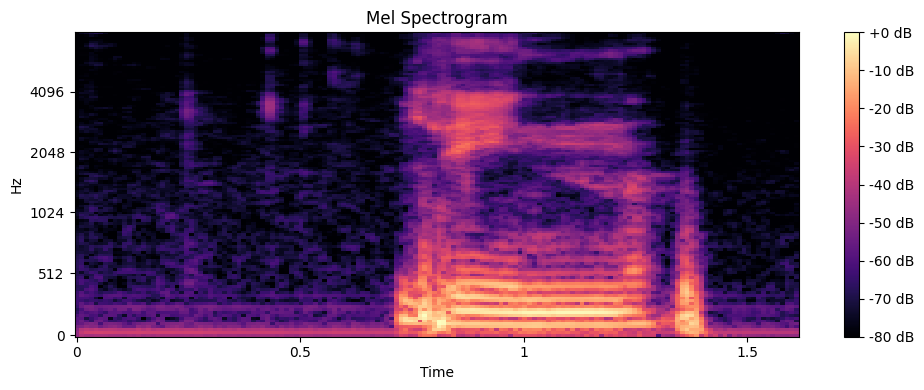

In [16]:
display_listenable_audio(df.head(1))

### Analiza pojedyńczego słowa (selected_embedding)

Poprawne nagrania dla embedding==0
Playing ../../recordings/stageI/1507/a0.wav with label 1


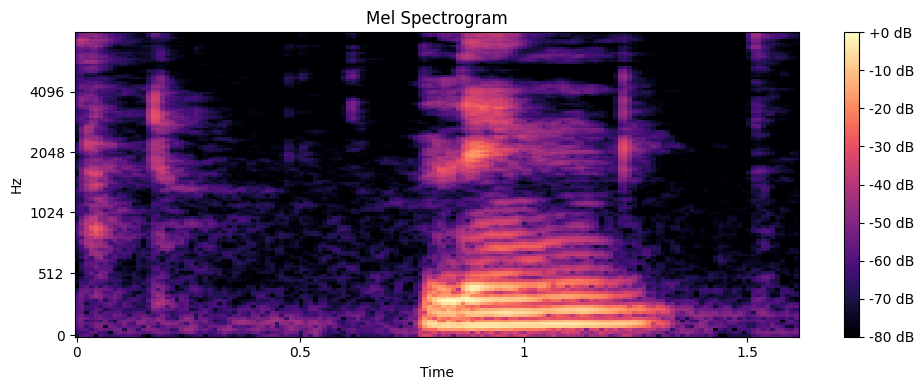

Playing ../../recordings/stageI/969/a0.wav with label 1


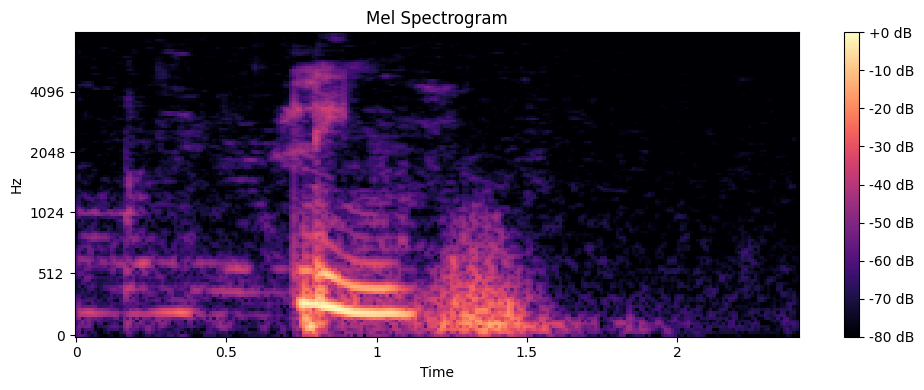

Playing ../../recordings/stageI/1441/a0.wav with label 1


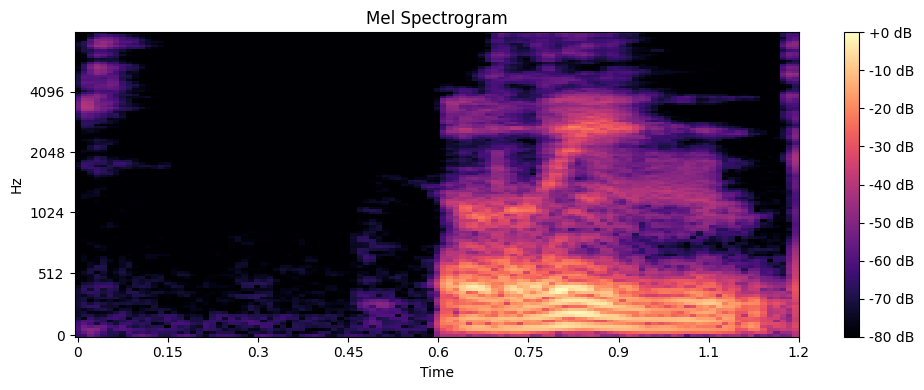

Niepoprawne nagrania dla embedding==0
Playing ../../recordings/stageI/382/a0.wav with label 0


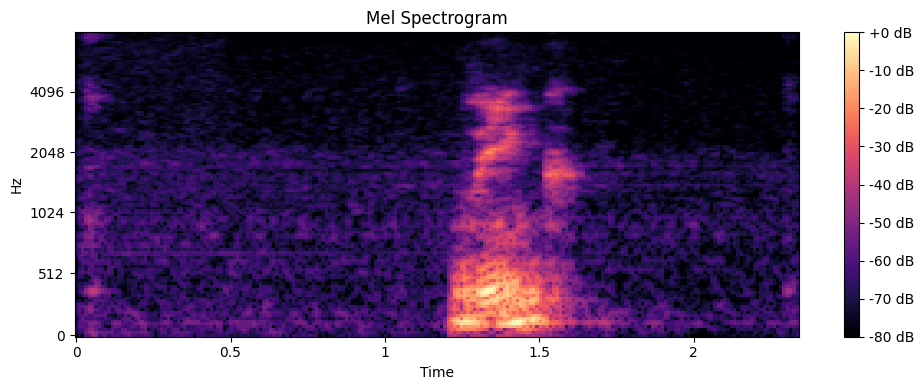

Playing ../../recordings/stageI/345/a0.wav with label 0


c:\Projekty_magister_sem2\projekt_badawczy\Speech-Recognition-Model-for-Mandarin-Chinese\projects\PronunciationBinaryClassifier\venv\Lib\site-packages\IPython\lib\display.py:187: RuntimeWarning: invalid value encountered in divide
  scaled = data / normalization_factor * 32767
c:\Projekty_magister_sem2\projekt_badawczy\Speech-Recognition-Model-for-Mandarin-Chinese\projects\PronunciationBinaryClassifier\venv\Lib\site-packages\IPython\lib\display.py:188: RuntimeWarning: invalid value encountered in cast
  return scaled.astype("<h").tobytes(), nchan


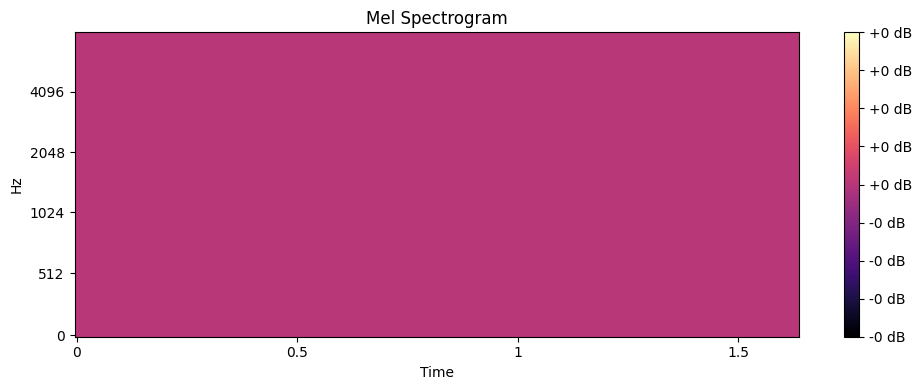

Playing ../../recordings/stageI/1418/a0.wav with label 0


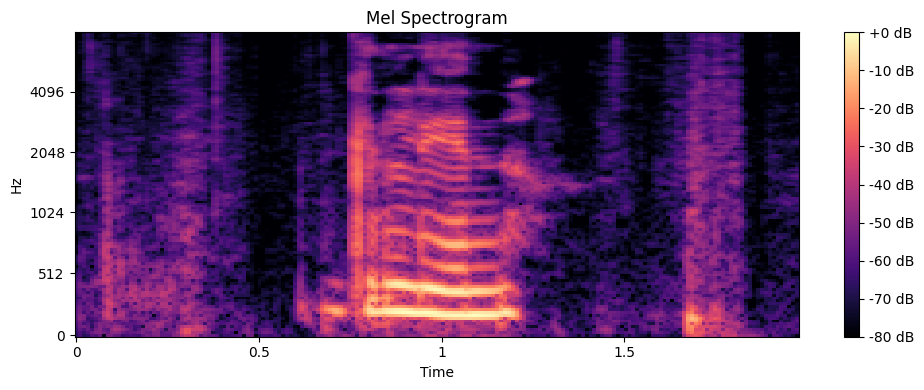

In [17]:
selected_embedding = 0

filtered_df = df[df['embedding'] == selected_embedding]
label_1_df = filtered_df[filtered_df['label'] == 1]
label_0_df = filtered_df[filtered_df['label'] == 0]
print(f"Poprawne nagrania dla embedding=={selected_embedding}")
display_listenable_audio(label_1_df.sample(n=min(3, len(label_1_df)), random_state=None))
print(f"Niepoprawne nagrania dla embedding=={selected_embedding}")
display_listenable_audio(label_0_df.sample(n=min(3, len(label_0_df)), random_state=None))


### Usunięcie nagrań z dużym szumem

In [18]:
noise_threshold = 0.004

In [19]:
df['rms'] = df['audio'].apply(lambda x: np.sqrt(np.mean(np.square(x[0]))))


Liczba nagrań z za dużym szumem: 18
Playing ../../recordings/stageI/138/a0.wav with label 1


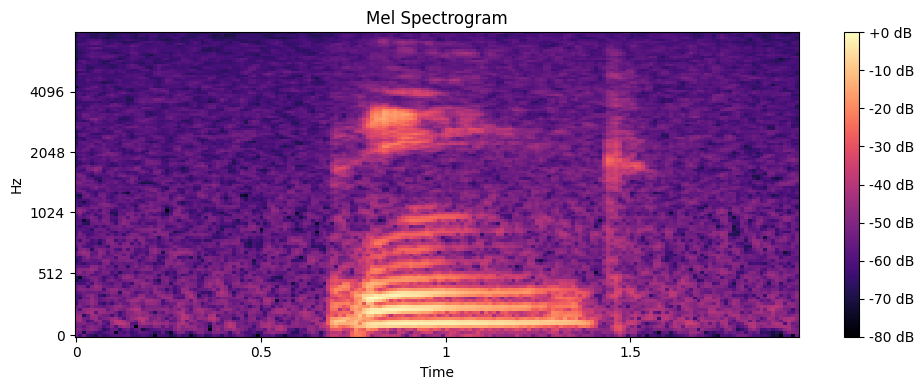

Playing ../../recordings/stageI/550/a0.wav with label 0


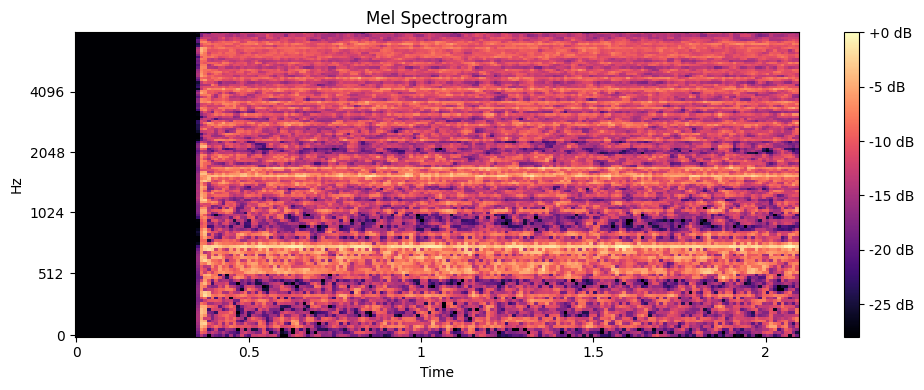

Playing ../../recordings/stageI/1293/a0.wav with label 0


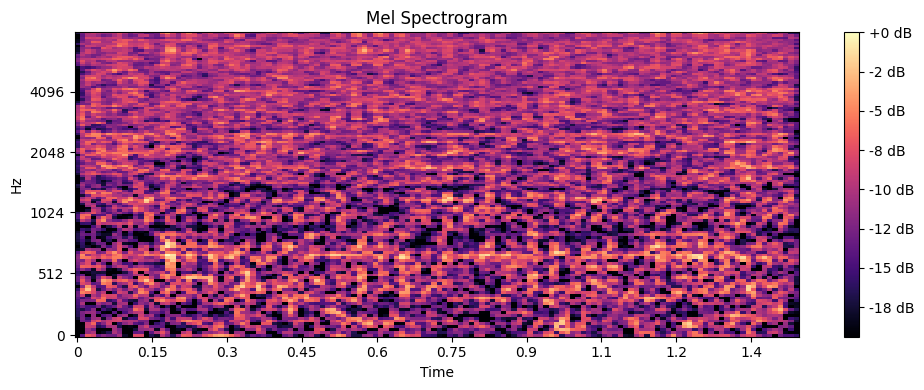

In [20]:
noisy_df = df[df['rms'] < noise_threshold]
print("\nLiczba nagrań z za dużym szumem:", len(noisy_df))
display_listenable_audio(noisy_df.sample(n=min(3, len(noisy_df)), random_state=None))


In [21]:
df = df[df['rms'] >= noise_threshold]
print("\nLiczba nagrań po usunięciu:", len(df))


Liczba nagrań po usunięciu: 498


### Usunięcie krótkich nagrań

In [22]:
duration_seconds_threshold = 0.5

In [23]:
df['duration'] = df['audio'].apply(lambda x: librosa.get_duration(y=x[0], sr=x[1]))

In [24]:
short_df = df[df['duration'] < duration_seconds_threshold]
print("\nLiczba nagrań z za krótkim czasem trwania:", len(short_df))
display_listenable_audio(short_df.sample(n=min(3, len(short_df)) , random_state=None))


Liczba nagrań z za krótkim czasem trwania: 0


In [25]:
df = df[df['duration'] > duration_seconds_threshold]
print("\nLiczba nagrań po usunięciu:", len(df))


Liczba nagrań po usunięciu: 498


### Usunięcie ciszy z nagrań

In [26]:
top_db = 30

In [27]:
def remove_silence(audio, sr, top_db=30):
    trimmed_audio, _ = librosa.effects.trim(audio, top_db=top_db)
    return trimmed_audio
df['trimmed_audio'] = df['audio'].apply(lambda x: (remove_silence(x[0], x[1]), x[1]))

Playing ../../recordings/stageI/495/a0.wav with label 0


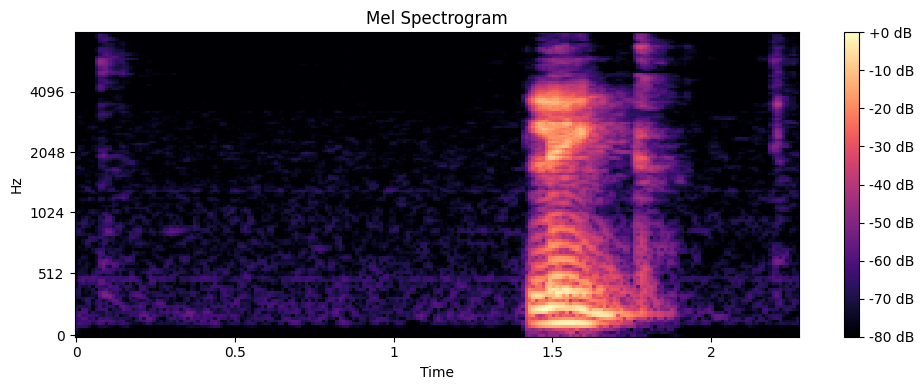

trimmed_audio


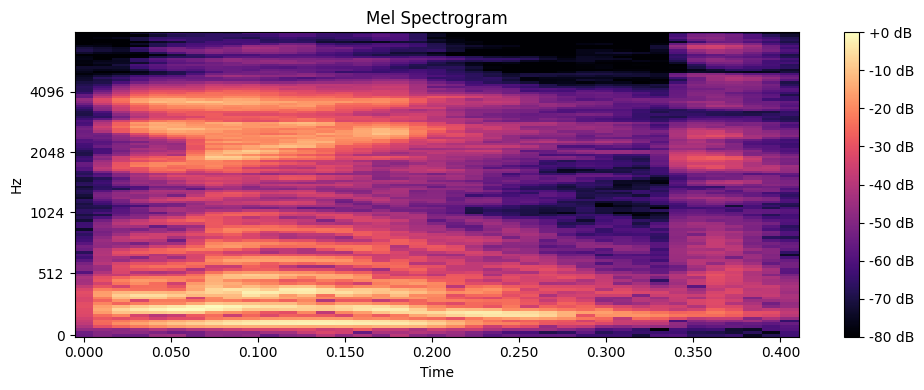

Playing ../../recordings/stageI/1059/a0.wav with label 0


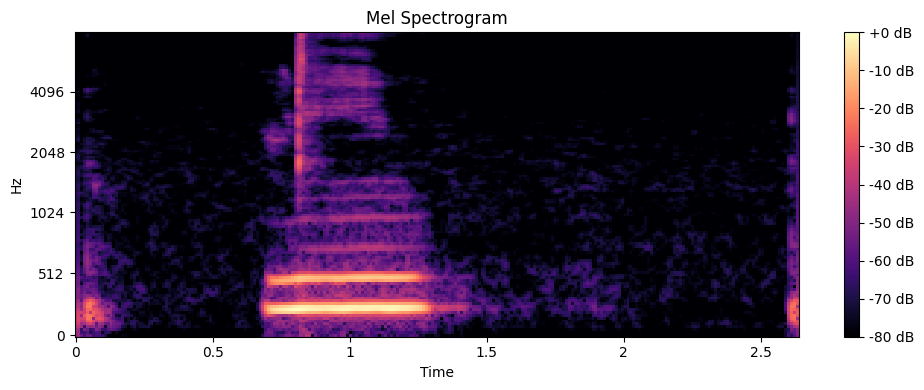

trimmed_audio


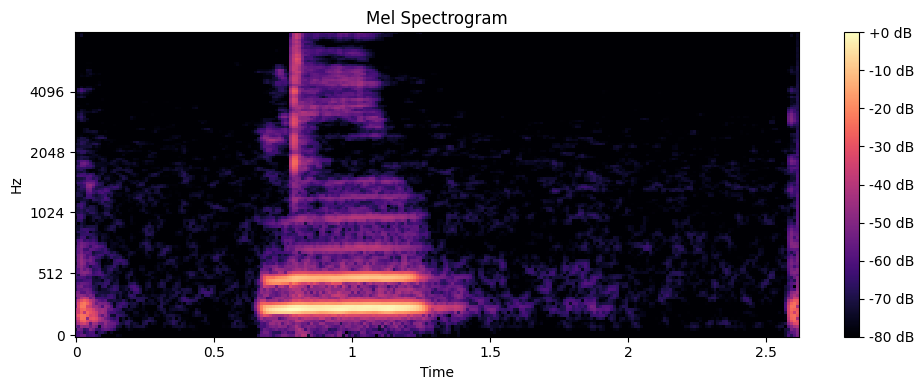

Playing ../../recordings/stageI/394/a0.wav with label 0


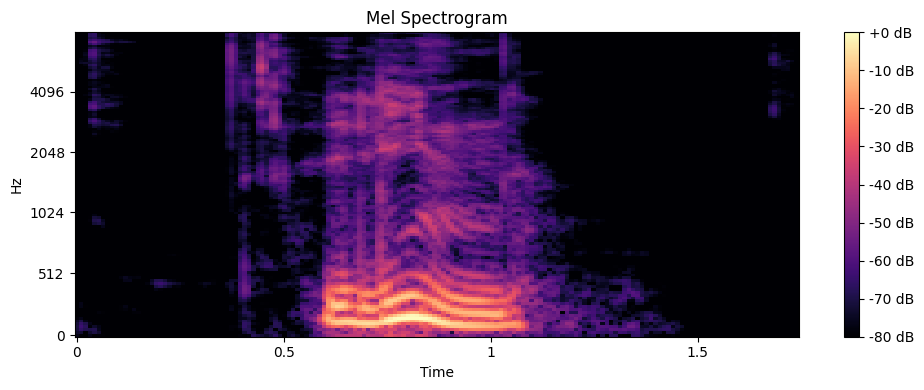

trimmed_audio


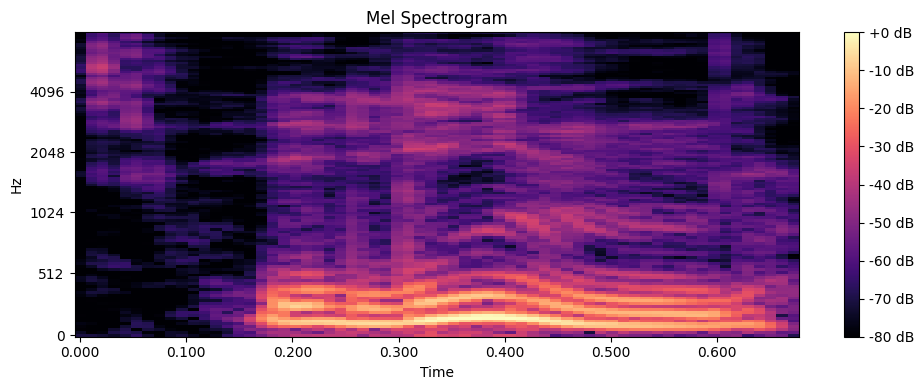

In [28]:
display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['trimmed_audio'])

In [29]:
df['audio'] = df['trimmed_audio']
df = df.drop(columns=['trimmed_audio'])

### Redukcja szumu

In [30]:
noise_profile = 0.5 
lowcut = 80
highcut = 8000

1. Redukcja szumu za pomocą profilowania szumu z początku nagrania

In [31]:


def reduce_noise_in_audio(audio, sr):
    noise_part = audio[:int(noise_profile * sr)]
    return reduce_noise(y=audio, sr=sr, y_noise=noise_part)

df['reduced_audio'] = df['audio'].apply(lambda x: (reduce_noise_in_audio(x[0], x[1]), x[1]))

2. Filtry pasmowe

In [32]:
def butter_bandpass_filter(audio, sr):
    nyquist = 0.5 * sr
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(1, [low, high], btype='band')
    return lfilter(b, a, audio)

df['reduced_audio2'] = df['reduced_audio'].apply(lambda x: (butter_bandpass_filter(x[0], x[1]), x[1]))

3. Redukcja szumu spektrogramu

In [33]:
def spectral_noise_reduction(audio, sr):
    # Tworzenie spektrogramu
    stft = librosa.stft(audio)
    magnitude, phase = librosa.magphase(stft)

    # Średnia amplituda jako próg
    noise_threshold = np.mean(magnitude) * 0.5
    reduced_magnitude = np.where(magnitude > noise_threshold, magnitude, 0)

    # Odwrotna transformacja
    return librosa.istft(reduced_magnitude * phase)

df['reduced_audio3'] = df['reduced_audio2'].apply(lambda x: (spectral_noise_reduction(x[0], x[1]), x[1]))

4. Normalizacja poziomu głośności

In [34]:
def normalize_audio(audio):
    return librosa.util.normalize(audio)

df['reduced_audio4'] = df['reduced_audio3'].apply(lambda x: (normalize_audio(x[0]), x[1]))

Playing ../../recordings/stageI/698/a0.wav with label 0


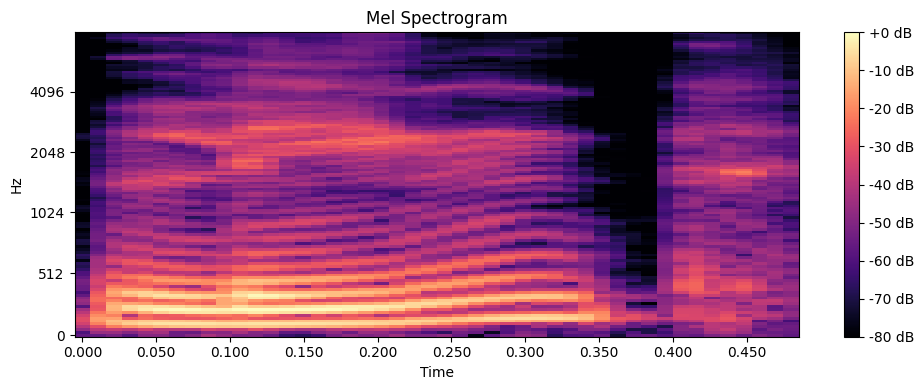

reduced_audio


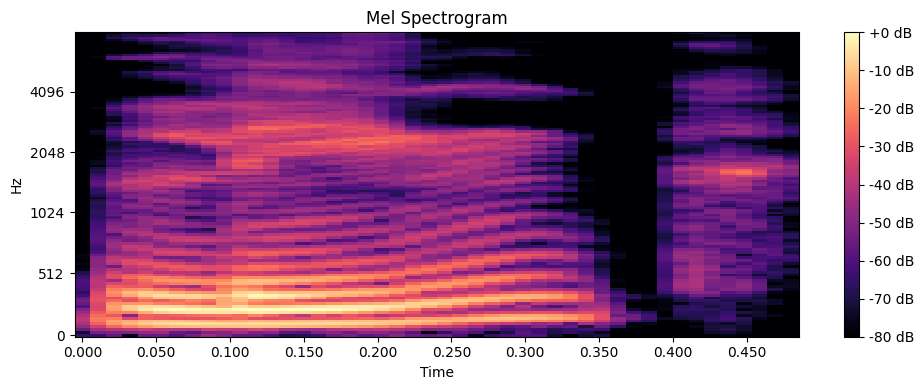

reduced_audio2


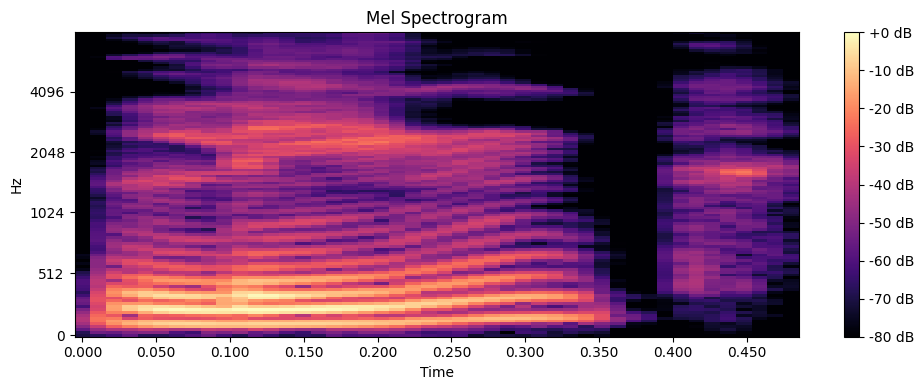

reduced_audio3


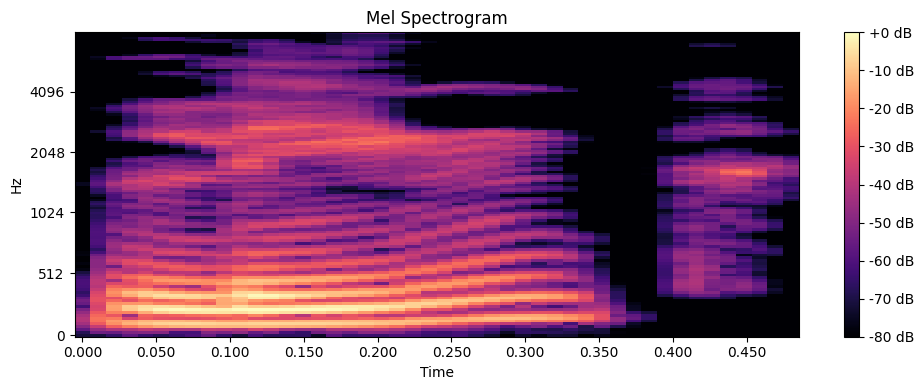

reduced_audio4


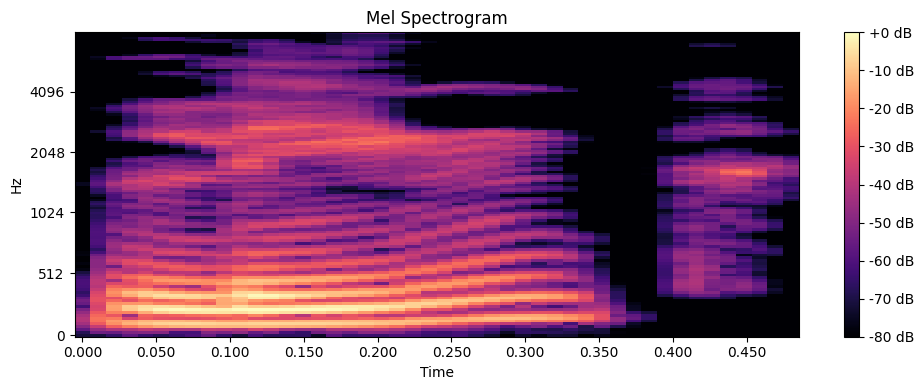

Playing ../../recordings/stageI/378/a0.wav with label 0


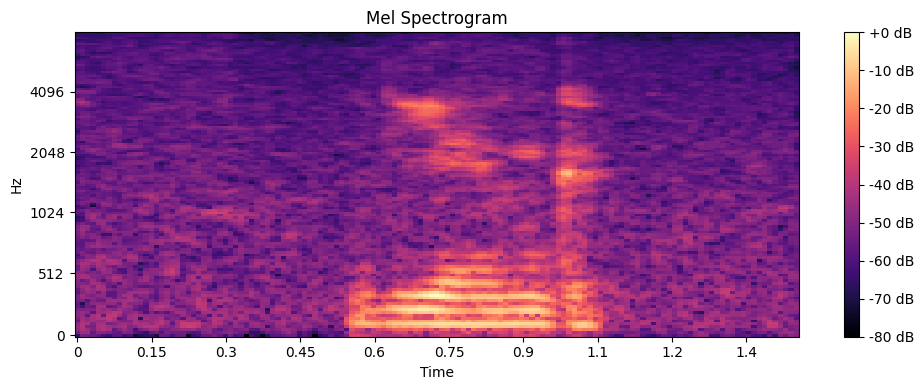

reduced_audio


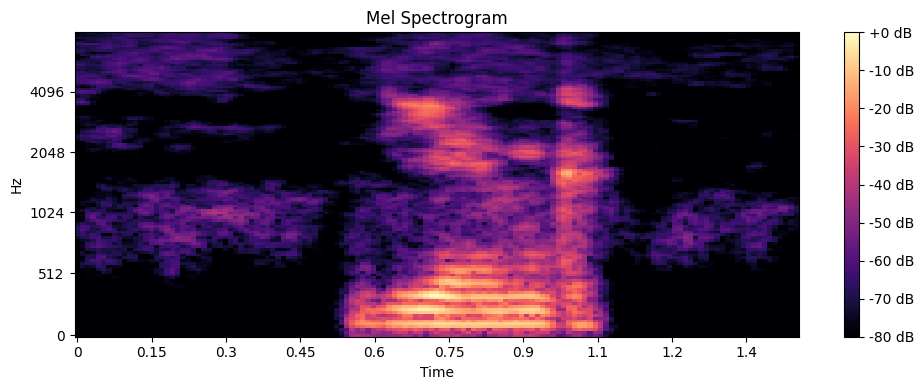

reduced_audio2


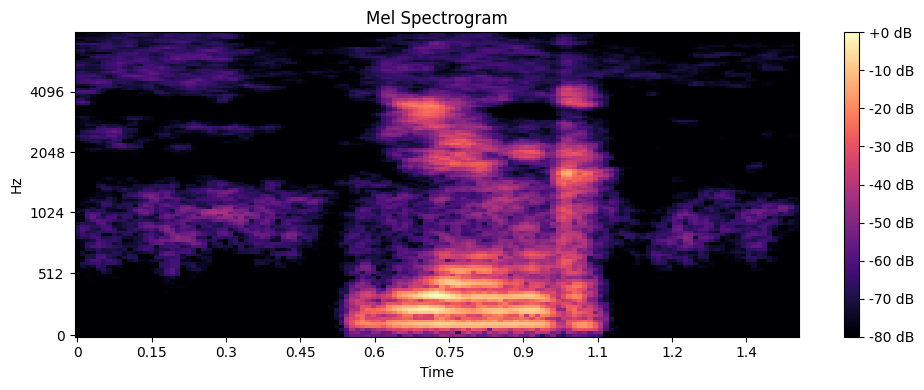

reduced_audio3


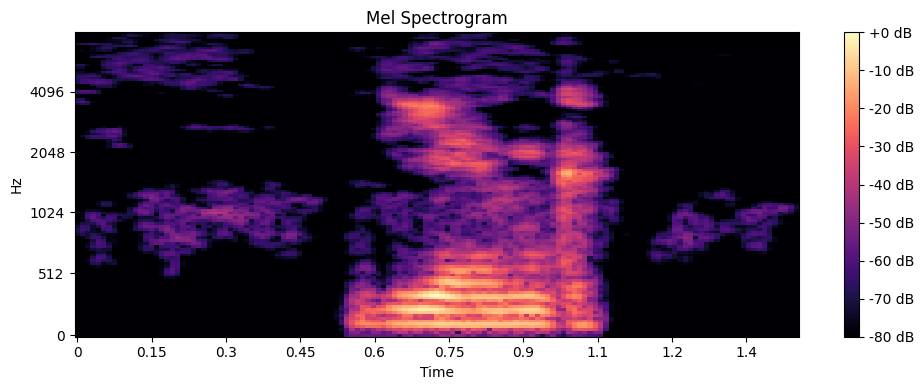

reduced_audio4


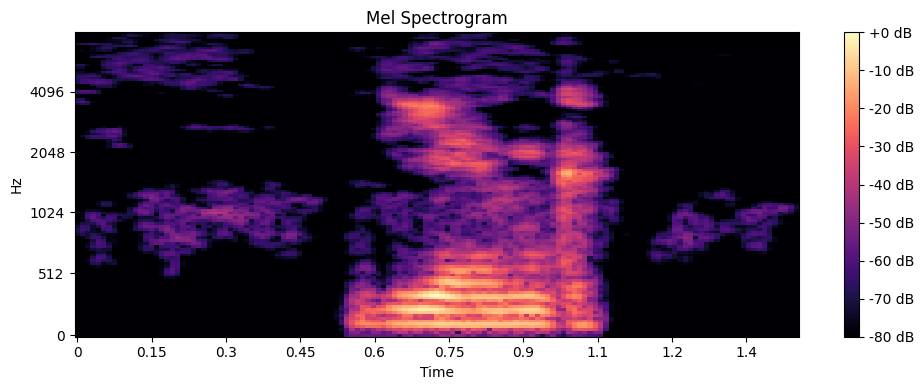

Playing ../../recordings/stageI/685/a0.wav with label 0


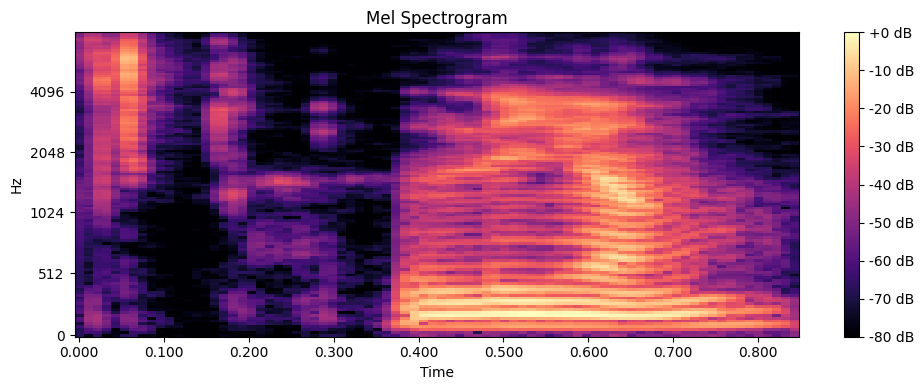

reduced_audio


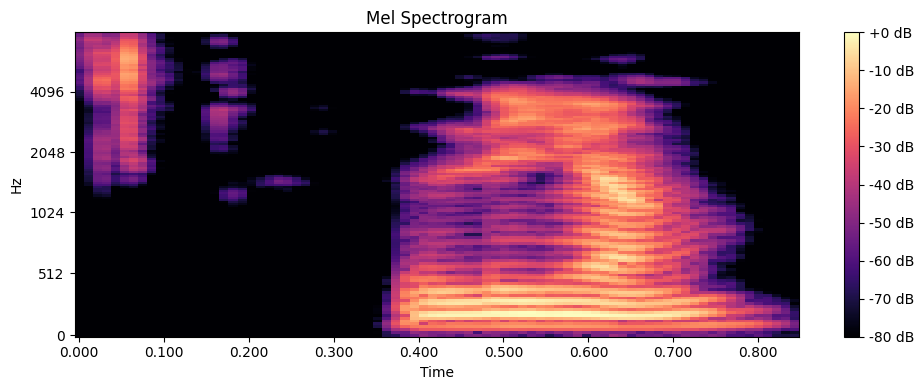

reduced_audio2


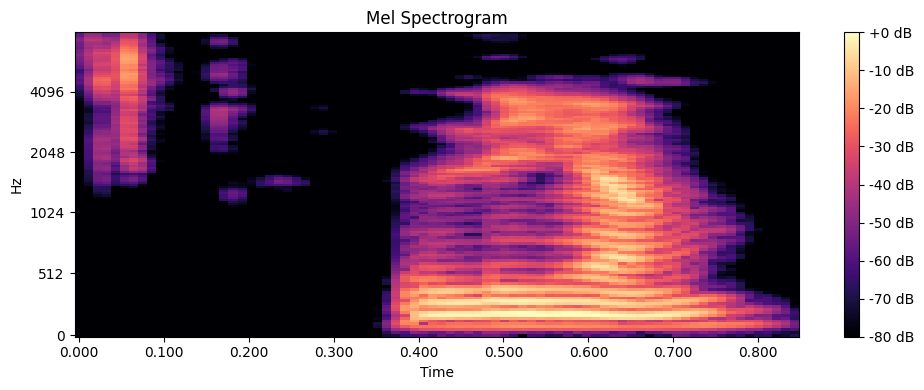

reduced_audio3


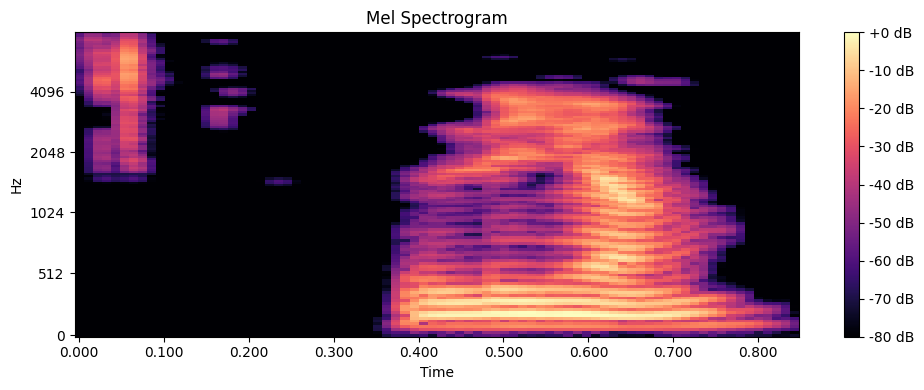

reduced_audio4


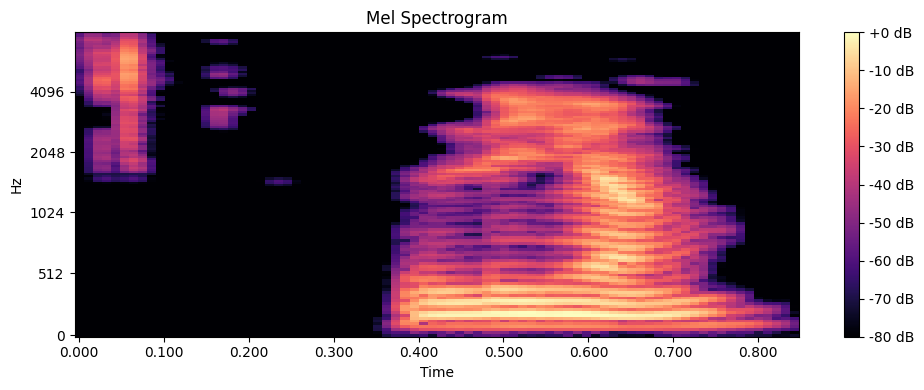

In [35]:
display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['reduced_audio', 'reduced_audio2', 'reduced_audio3', 'reduced_audio4'])

In [36]:
df['audio'] = df['reduced_audio4']
df = df.drop(columns=['reduced_audio', 'reduced_audio2', 'reduced_audio3', 'reduced_audio4'])

### Standaryzacja pasma częstotliwości

In [37]:
target_sr = 16000

In [38]:
def resample_audio(audio, sr):
    if sr != target_sr:
        audio = librosa.resample(audio, orig_sr=sr, target_sr=target_sr)
    return audio, target_sr

df['resampled_audio'] = df['audio'].apply(lambda x: resample_audio(x[0], x[1]))

In [39]:
print("Stare częstotliwości próbkowania:", df['audio'].apply(lambda x: x[1]).unique())
print("Nowe częstotliwości próbkowania:", df['resampled_audio'].apply(lambda x: x[1]).unique())

Stare częstotliwości próbkowania: [48000 44100]
Nowe częstotliwości próbkowania: [16000]


Playing ../../recordings/stageI/1383/a0.wav with label 0


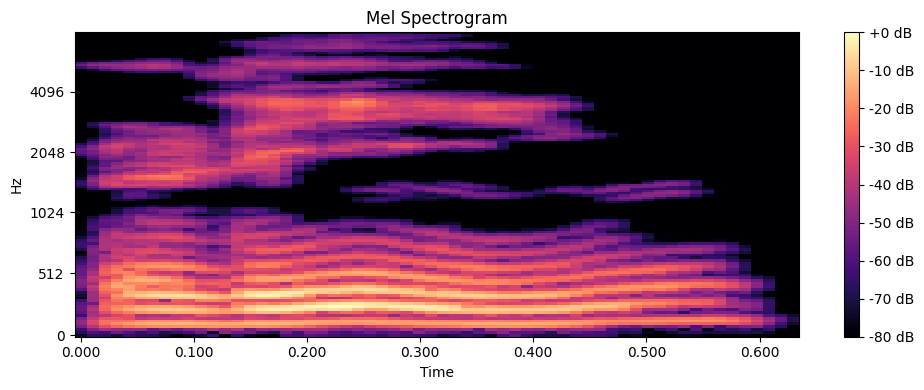

resampled_audio


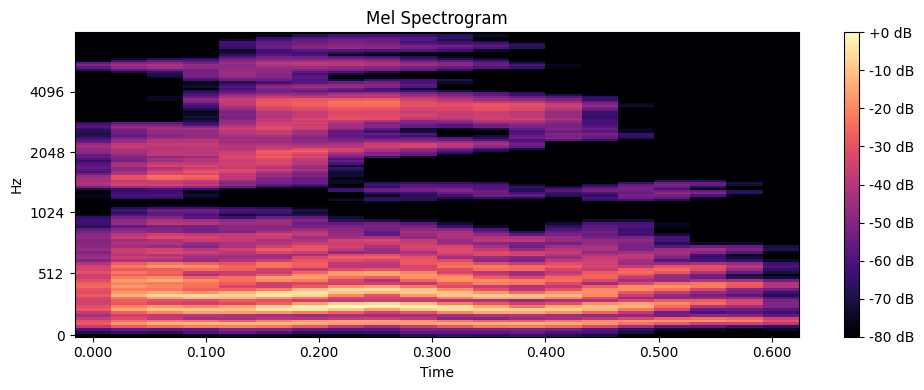

Playing ../../recordings/stageI/1357/a0.wav with label 0


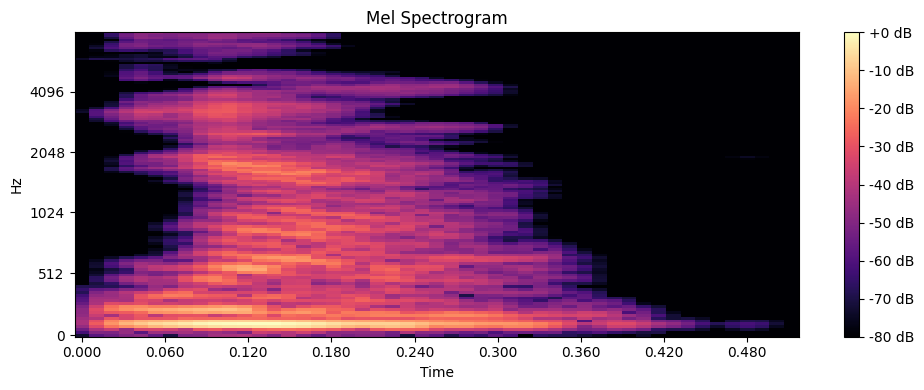

resampled_audio


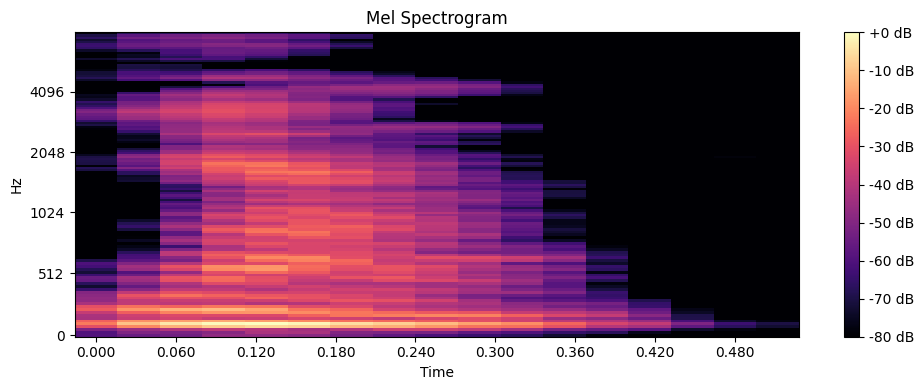

Playing ../../recordings/stageI/671/a0.wav with label 1


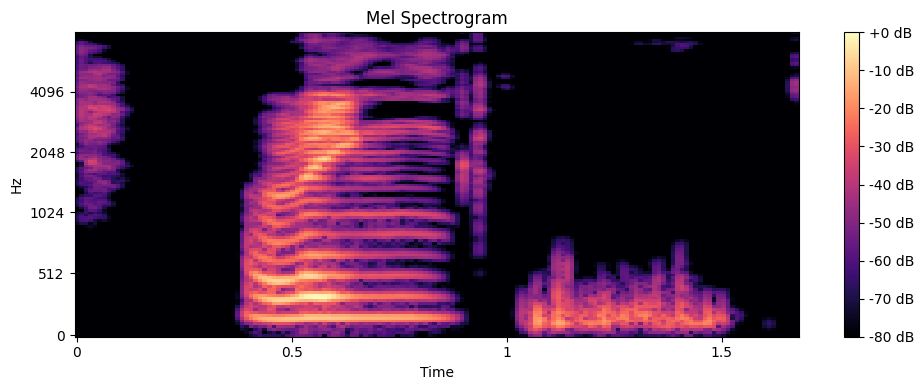

resampled_audio


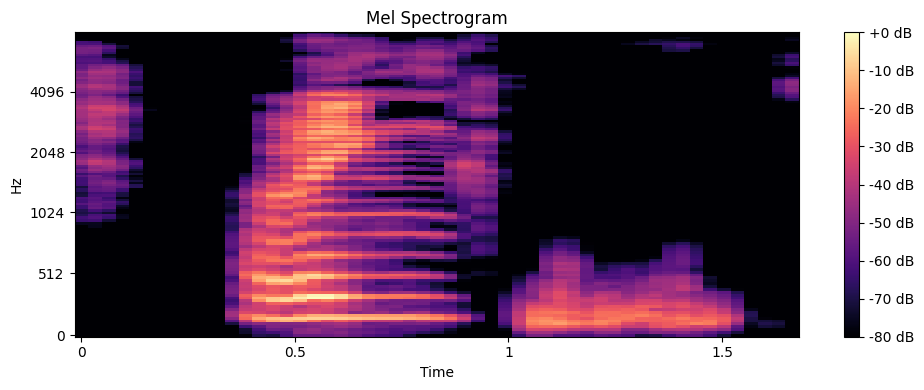

In [40]:
display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['resampled_audio'])

In [41]:
df['audio'] = df['resampled_audio']
df = df.drop(columns=['resampled_audio'])

### Usunięcie ekstremalnie długich nagrań

In [42]:
df['length_samples'] = df['audio'].apply(lambda x: len(x[0]))

In [43]:
df_sorted = df.sort_values(by='length_samples', ascending=False)
top_5_longest = df_sorted.head(5)
print("5 najdłuższych nagrań (liczba próbek):")
for idx, row in top_5_longest.iterrows():
    print(f"{idx}: {row['length_samples']} próbek")
average_length = df['length_samples'].mean()
print(f"Średnia długość wszystkich próbek wynosi {average_length:.2f} próbek.")
print(f"Liczba elementów {len(df)} elementów przed usunięciem ekstremalnie długich próbek.")

5 najdłuższych nagrań (liczba próbek):
501: 71851 próbek
372: 58539 próbek
496: 48640 próbek
213: 47958 próbek
14: 47275 próbek
Średnia długość wszystkich próbek wynosi 16605.00 próbek.
Liczba elementów 498 elementów przed usunięciem ekstremalnie długich próbek.


In [44]:
threshold = df['length_samples'].quantile(0.95)
print(f"threshold: {threshold}")
df_filtered = df[df['length_samples'] <= threshold]

threshold: 36574.149999999994


In [45]:
df_sorted = df_filtered.sort_values(by='length_samples', ascending=False)
top_5_longest = df_sorted.head(5)
print("5 najdłuższych nagrań (liczba próbek):")
for idx, row in top_5_longest.iterrows():
    print(f"{idx}: {row['length_samples']} próbek")
average_length = df['length_samples'].mean()
print(f"Średnia długość wszystkich próbek wynosi {average_length:.2f} próbek.")

5 najdłuższych nagrań (liczba próbek):
487: 36523 próbek
167: 36182 próbek
417: 35158 próbek
96: 34816 próbek
112: 34475 próbek
Średnia długość wszystkich próbek wynosi 16605.00 próbek.


In [46]:
print(f"Pozostało {len(df)} elementów przed usunięciem ekstremalnie długich próbek.")
df = df_filtered
print(f"Pozostało {len(df)} elementów po usunięciu ekstremalnie długich próbek.")

Pozostało 498 elementów przed usunięciem ekstremalnie długich próbek.
Pozostało 473 elementów po usunięciu ekstremalnie długich próbek.


### Wyrównanie długości nagrań do najdłuższego

In [47]:
def pad_to_max_length(audio, max_length):
    if len(audio) < max_length:
        return np.pad(audio, (0, max_length - len(audio)), mode='constant')
    elif len(audio) > max_length:
        return audio[:max_length]
    return audio
max_length = df['length_samples'].max()
df['pad_audio'] = df['audio'].apply(lambda x: (pad_to_max_length(x[0], max_length), x[1]))

In [48]:
print("Stare długości nagrań:", df['audio'].apply(lambda x: len(x[0])).unique())
print("Nowe długości nagrań:", df['pad_audio'].apply(lambda x: len(x[0])).unique())

Stare długości nagrań: [16214 29014 10752  8534  9387 11435  8022 11606 24064 26795  8704 18944
  9728 22528 11776 21504  7510 12118 10240 21334  8363 29867 23894 13142
  8192 10411 19115 20310  9046  6315 22016 19456 19798 30720 11264 27136
 19968 26624 23552  7680  9558  7168 28331 14336 17238  8875 24747  7339
 16896 27648 22187 15872 11094  5632  6998 16555 31062 27307 19286 23211
 30038 34816 20992 10582 24918 18432 25942 10070 34475 13483 16726 12971
 26966 13824 20139 18603  9216 24406 21846 12630 14166 12459 10923 29526
 26112 28502 27819 25088 15360  6486 23382 14848 23723 36182 15702 16043
 19627  5974 13654 29355 32256 25430 15531 20480 22699 11947  6144  6827
 28672 17750 13995 12800 30550 25771 30379  7851 24576 23040 29184 15190
 12288 16384 27478  9899 26454 34134 17067 32086 25600 21675 29696 33963
  6656 32598 33451 13312 18774 14678 24235 28160 33110 35158 20651 22358
 30208 31574 30891 21163 18091 27990 33622 36523 31915 22849]
Nowe długości nagrań: [36523]


Playing ../../recordings/stageI/1350/a0.wav with label 1


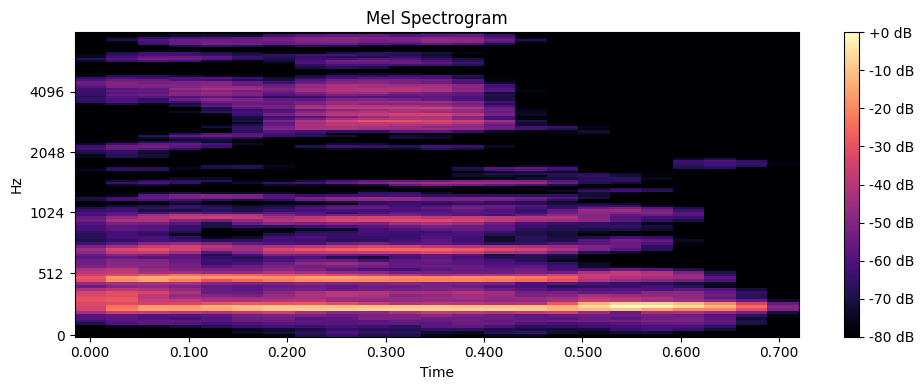

pad_audio


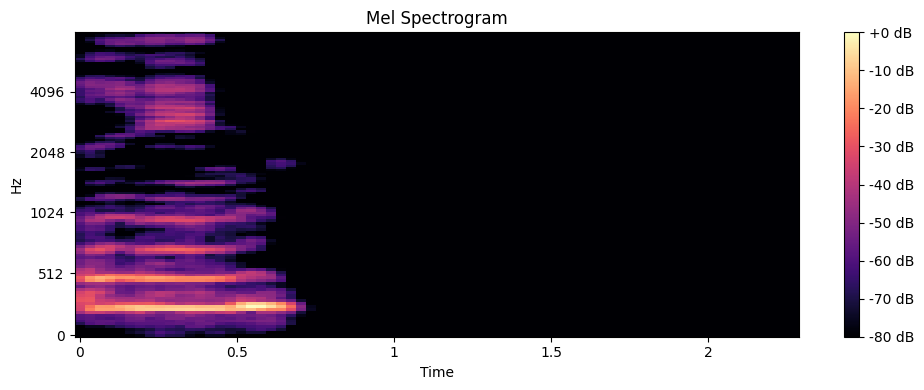

Playing ../../recordings/stageI/1332/a0.wav with label 1


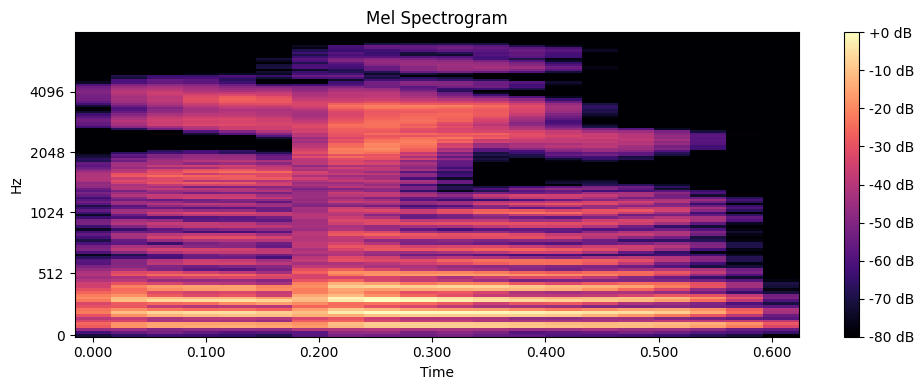

pad_audio


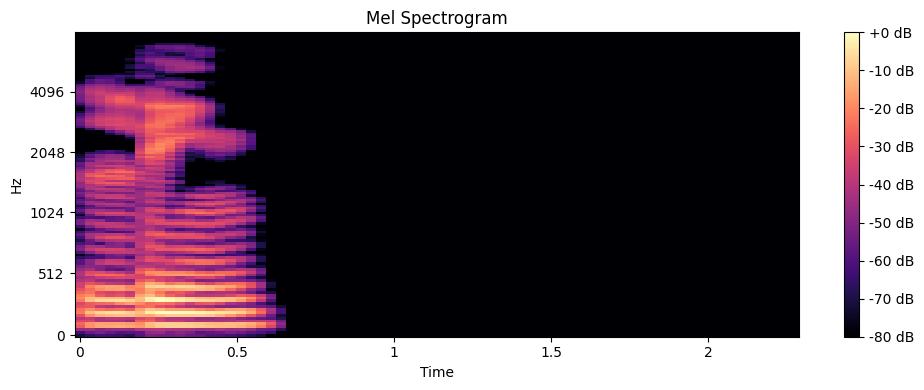

Playing ../../recordings/stageI/539/a0.wav with label 0


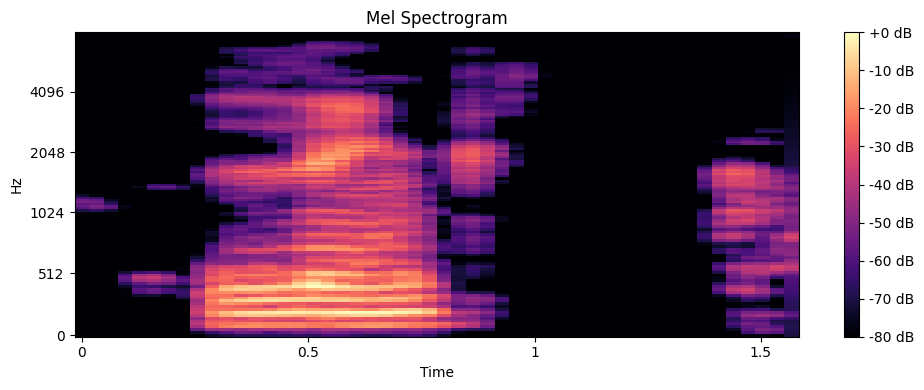

pad_audio


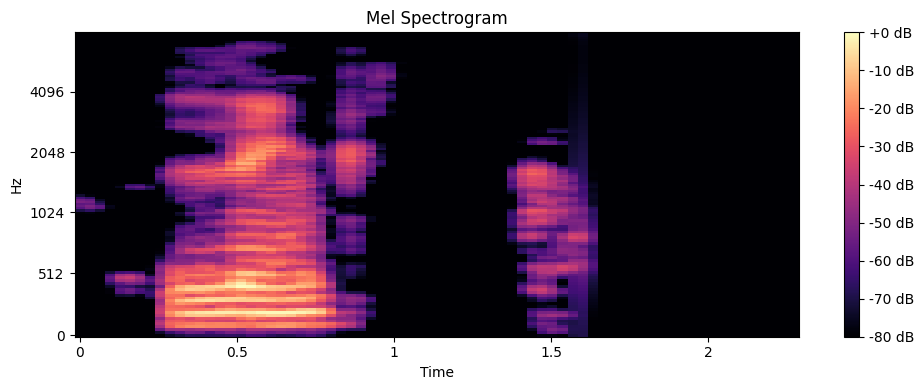

In [49]:
display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['pad_audio'])

In [50]:
df['audio'] = df['pad_audio']
df = df.drop(columns=['pad_audio'])

### Augmentacja

1. Dodanie szumu - lepiej nie używać

In [51]:
# noise_level = 0.005

In [52]:
# def add_noise(audio):
#     noise = noise_level * np.random.normal(0, 1, len(audio))
#     return audio + noise

# df['augmented_noise'] = df['audio'].apply(lambda x: (add_noise(x[0]), x[1]))

In [53]:
# display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['augmented_noise'])

2. Zmiana szybkości

In [54]:
def time_stretch(audio, rate):
    return librosa.effects.time_stretch(audio,rate=rate)

df['augmented_speed'] = df['audio'].apply(lambda x: (time_stretch(x[0], 1.5), x[1]))
df['augmented_speed'] = df['augmented_speed'].apply(lambda x: (pad_to_max_length(x[0], max_length), x[1]))

df['augmented_speed2'] = df['audio'].apply(lambda x: (time_stretch(x[0], 0.5), x[1]))
df['augmented_speed2'] = df['augmented_speed2'].apply(lambda x: (pad_to_max_length(x[0], max_length), x[1]))

Playing ../../recordings/stageI/692/a0.wav with label 0


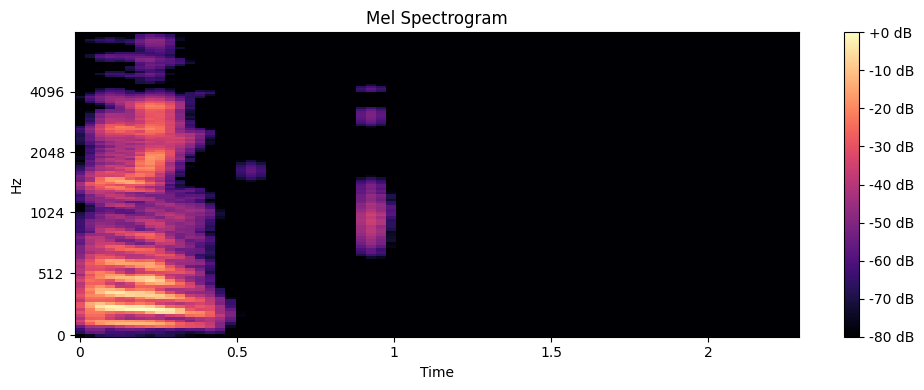

augmented_speed


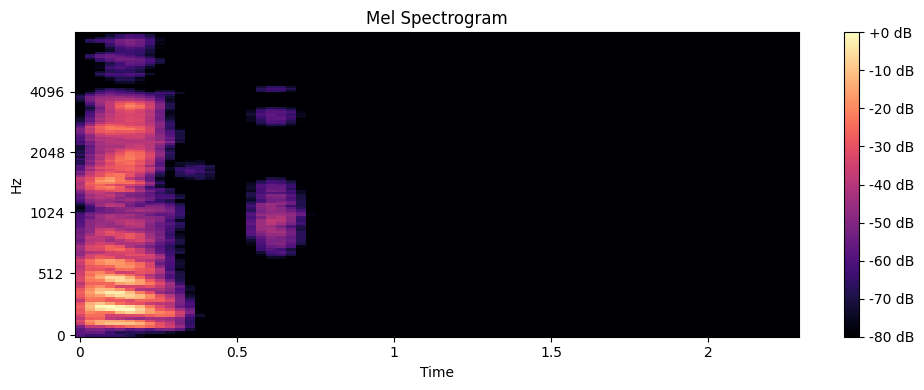

augmented_speed2


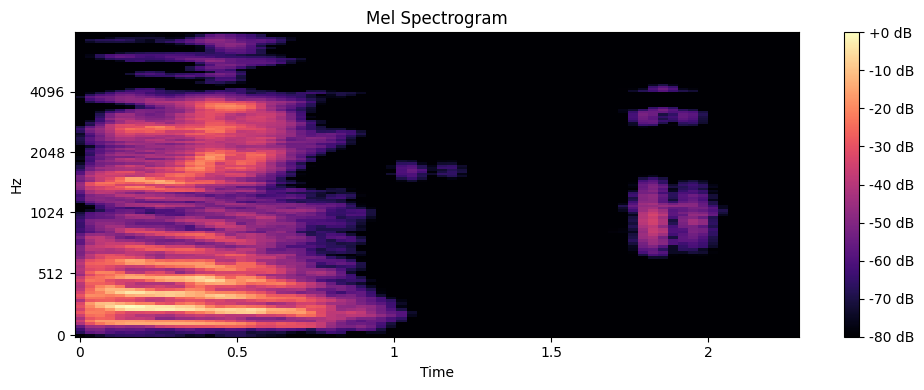

Playing ../../recordings/stageI/1516/a0.wav with label 1


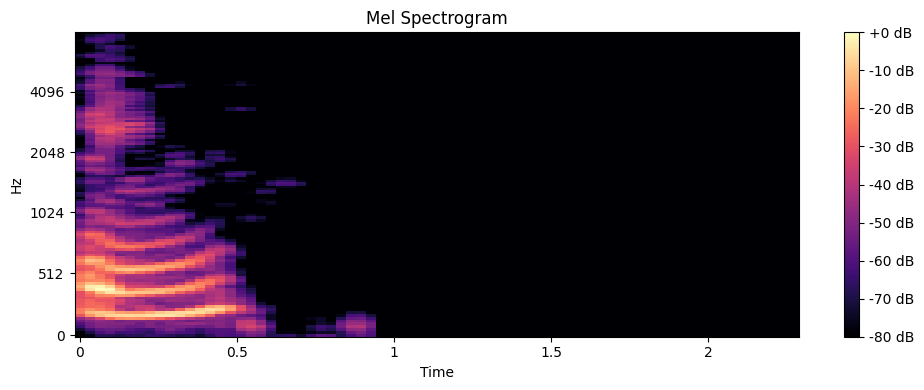

augmented_speed


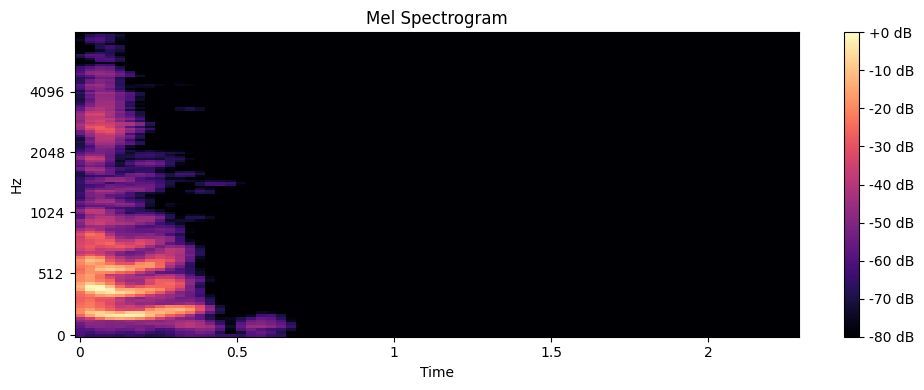

augmented_speed2


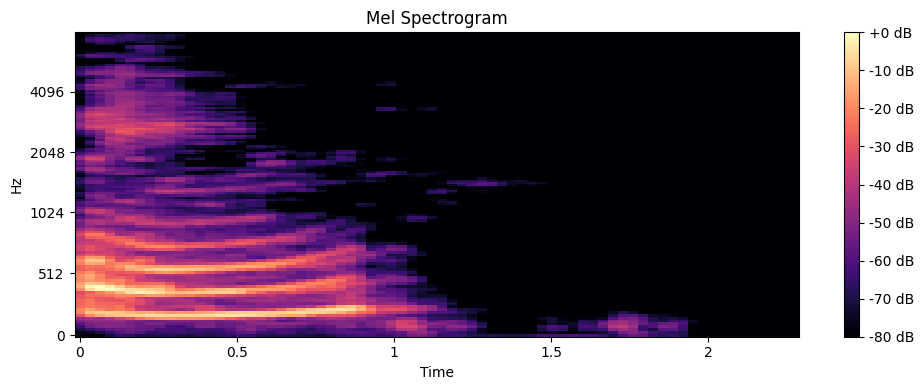

Playing ../../recordings/stageI/529/a0.wav with label 1


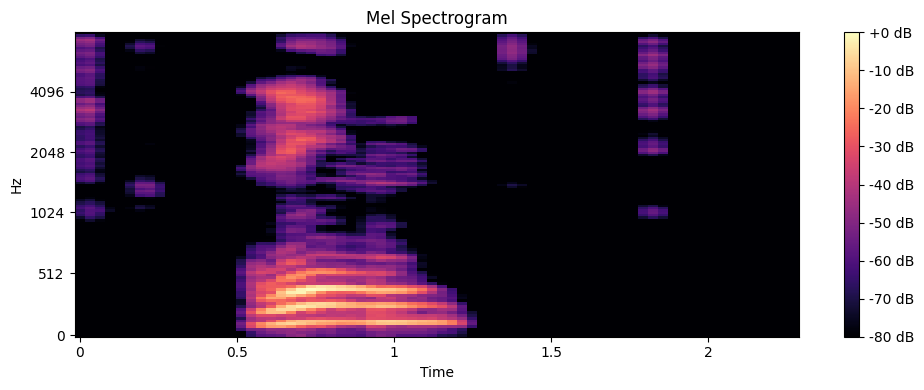

augmented_speed


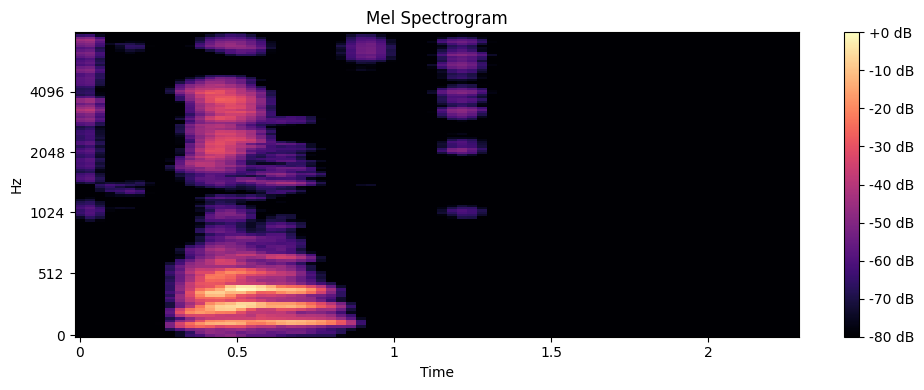

augmented_speed2


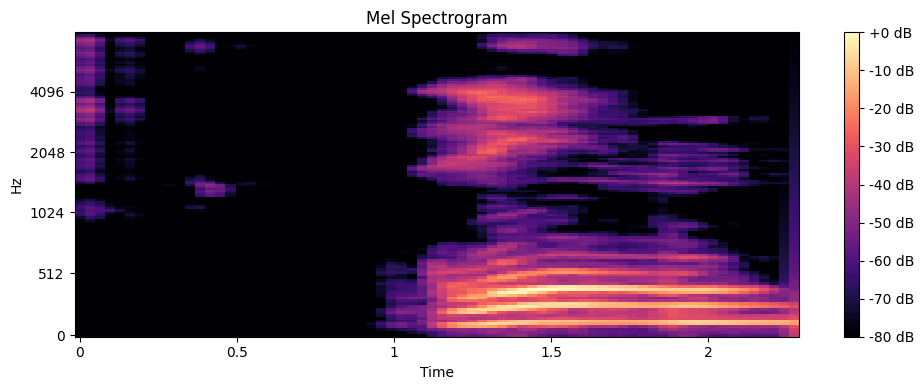

In [55]:
display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['augmented_speed', 'augmented_speed2'])

3. zmiana wysokości tonów

In [56]:
def pitch_shift(audio, sr, n_steps):
    return librosa.effects.pitch_shift(audio, sr=sr, n_steps=n_steps)

df['augmented_tone'] = df['audio'].apply(lambda x: (pitch_shift(x[0], x[1], -2), x[1]))
df['augmented_tone2'] = df['audio'].apply(lambda x: (pitch_shift(x[0], x[1], 2), x[1]))

Playing ../../recordings/stageI/764/a0.wav with label 0


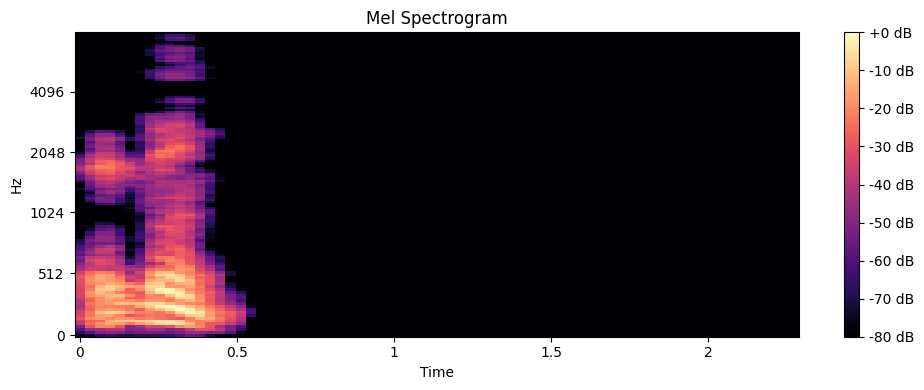

augmented_tone


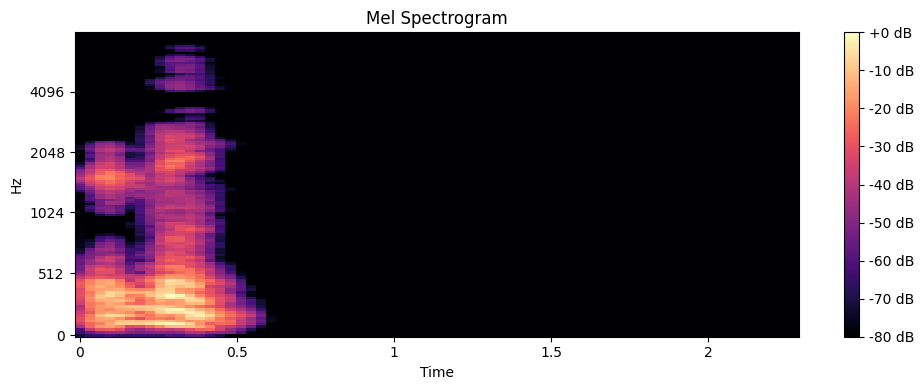

augmented_tone2


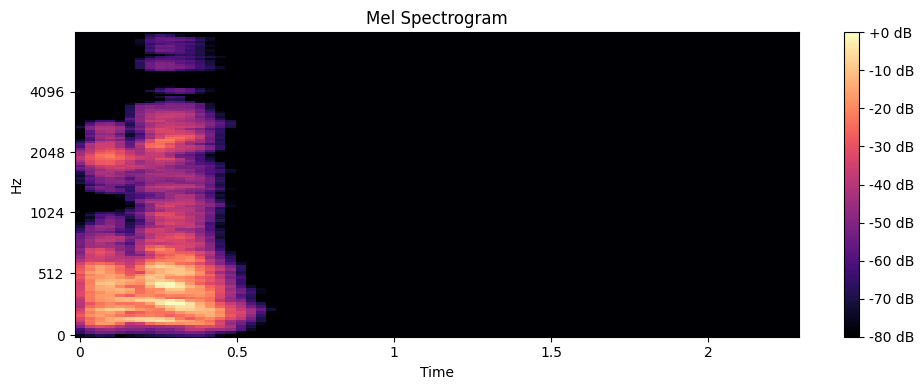

Playing ../../recordings/stageI/378/a0.wav with label 0


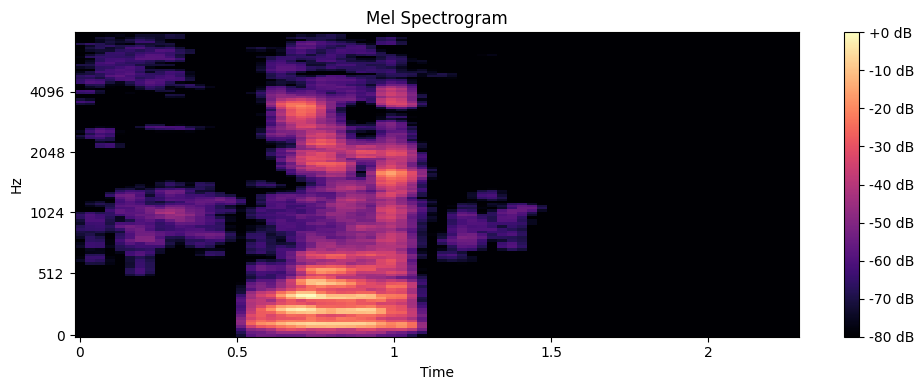

augmented_tone


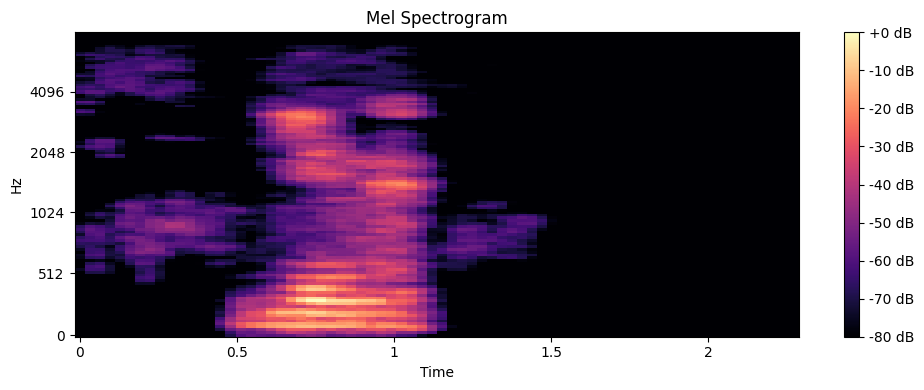

augmented_tone2


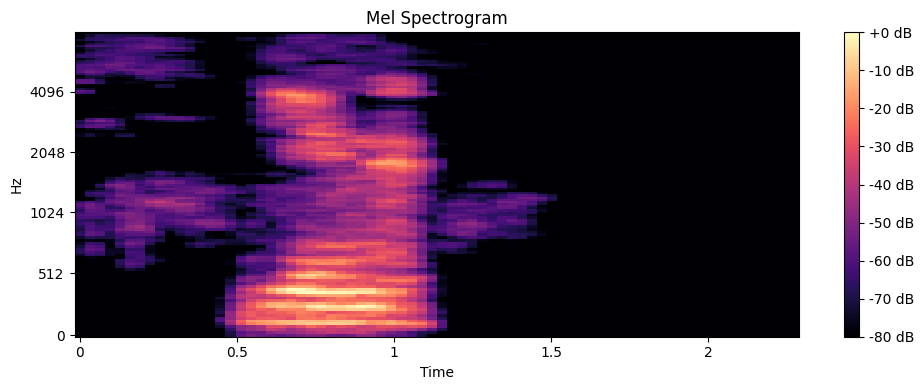

Playing ../../recordings/stageI/489/a0.wav with label 1


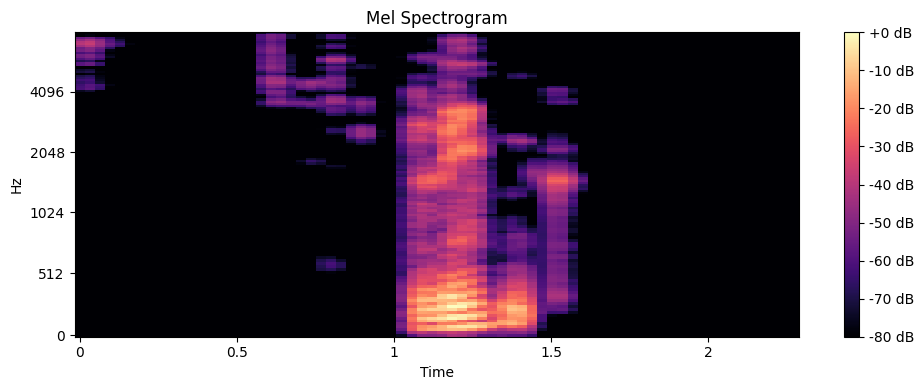

augmented_tone


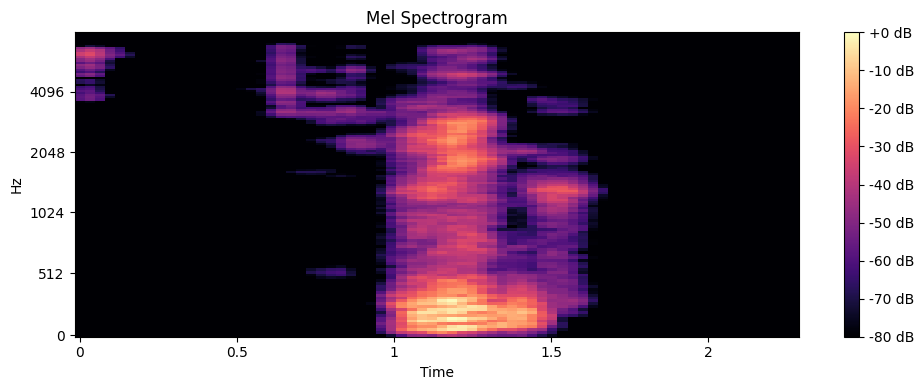

augmented_tone2


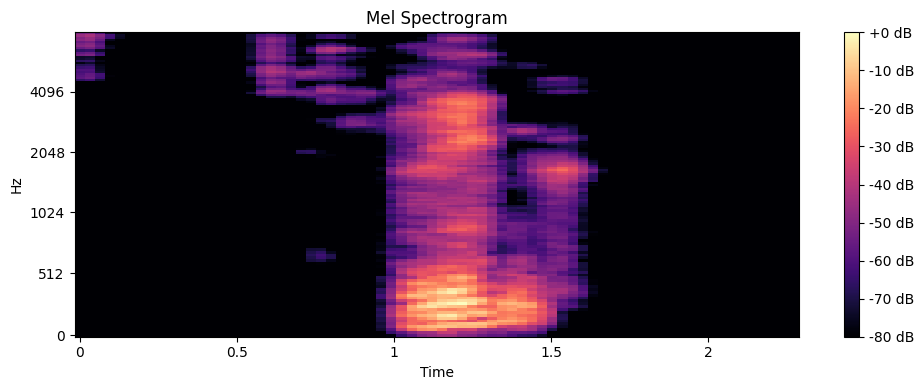

In [57]:
display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['augmented_tone', 'augmented_tone2'])

4. Zmiana głośności - chyba nic nie daje

In [58]:
# def change_volume(audio):
#     factor = np.random.uniform(-1.5, 1.5)
#     return audio * factor

# df['augmented_volume'] = df['audio'].apply(lambda x: (change_volume(x[0]), x[1]))

In [59]:
# display_listenable_audio(df.sample(n=min(3, len(df)), random_state=None), ['augmented_volume'])

### Zbalansowanie klas

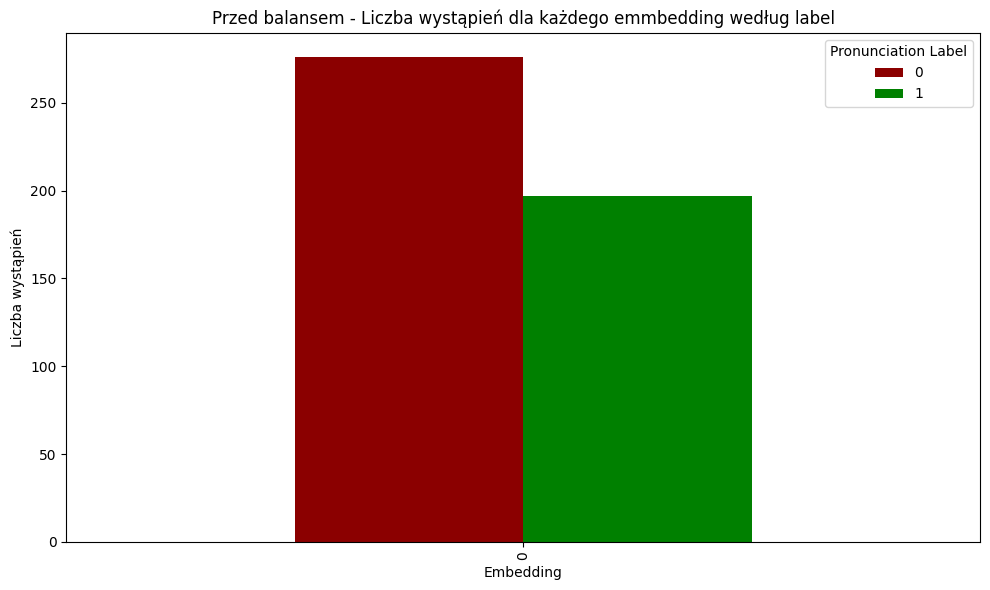

In [60]:
grouped_data = df.groupby(['embedding', 'label']).size().unstack(fill_value=0)
grouped_data.plot(kind='bar', figsize=(10, 6), color=['darkred', 'green'])
plt.xlabel('Embedding')
plt.ylabel('Liczba wystąpień')
plt.title('Przed balansem - Liczba wystąpień dla każdego emmbedding według label')
plt.legend(title='Pronunciation Label', labels=['0', '1'])
plt.tight_layout()
plt.show()

In [61]:
def balance_classes(data):
    balanced_data = []
    for word in data['embedding'].unique():
        subset = data[data['embedding'] == word]
        class_0 = subset[subset['label'] == 0]
        class_1 = subset[subset['label'] == 1]
        
        # Znajdź minimalną liczebność między klasami
        min_size = min(len(class_0), len(class_1))
        
        # Losowy wybór próbek do wyrównania
        class_0_balanced = class_0.sample(n=min_size, random_state=42)
        class_1_balanced = class_1.sample(n=min_size, random_state=42)
        
        # Dodaj zbalansowane dane do listy
        balanced_data.append(class_0_balanced)
        balanced_data.append(class_1_balanced)
    
    # Połącz wszystkie zbalansowane dane w jeden DataFrame
    return pd.concat(balanced_data).reset_index(drop=True)\

balanced_df = balance_classes(df)

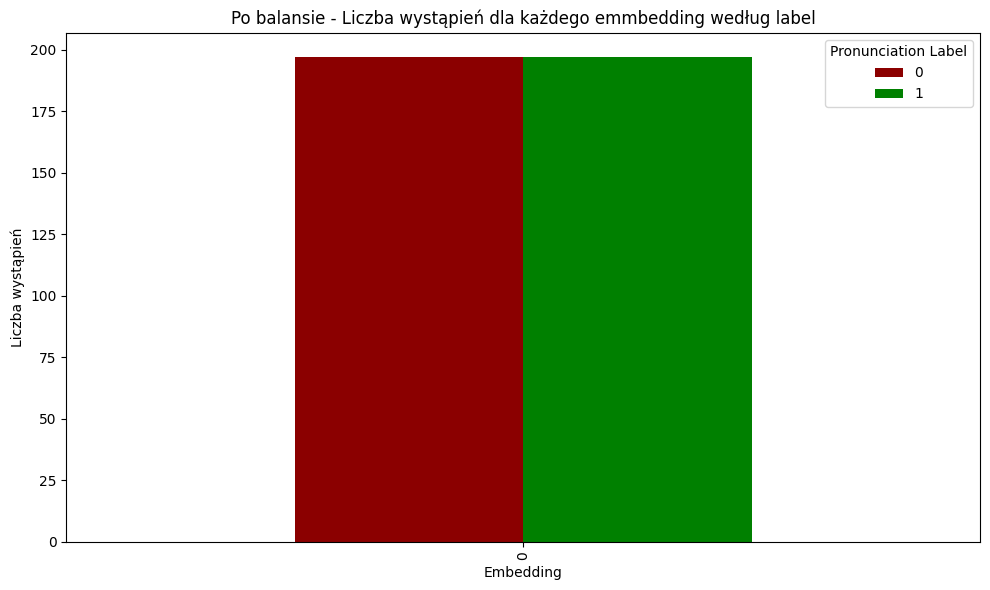

In [62]:
grouped_data = balanced_df.groupby(['embedding', 'label']).size().unstack(fill_value=0)
grouped_data.plot(kind='bar', figsize=(10, 6), color=['darkred', 'green'])
plt.xlabel('Embedding')
plt.ylabel('Liczba wystąpień')
plt.title('Po balansie - Liczba wystąpień dla każdego emmbedding według label')
plt.legend(title='Pronunciation Label', labels=['0', '1'])
plt.tight_layout()
plt.show()


### Ekstrakcja MFCC

In [63]:
def extract_mfcc(audio, sr, n_mfcc=13):
    mfcc = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=n_mfcc)
    return mfcc.T
balanced_df['mfcc'] = balanced_df['audio'].apply(lambda x: extract_mfcc(x[0], x[1]))

### Obliczenie spektogramów

In [64]:
balanced_df['mel_spectrogram'] = balanced_df['audio'].apply(lambda x: generate_mel_spectrogram(x[0], x[1]))

### Podział na zbiór treningowy, walidacyjny i testowy

In [65]:
train_df, temp_df = train_test_split(balanced_df, test_size=0.3, random_state=42, stratify=balanced_df['label'])
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42, stratify=temp_df['label'])

In [66]:
X_train = train_df['mfcc'].tolist()
word_indices_train = train_df['embedding'].tolist()
y_train = train_df['label'].tolist()

X_val = val_df['mfcc'].tolist()
word_indices_val = val_df['embedding'].tolist()
y_val = val_df['label'].tolist()

X_test = test_df['mfcc'].tolist()
word_indices_test = test_df['embedding'].tolist()
y_test = test_df['label'].tolist()

In [67]:
X_train_spect = train_df['mel_spectrogram'].tolist()
word_indices_train_spect = train_df['embedding'].tolist()
y_train_spect = train_df['label'].tolist()

X_val_spect = val_df['mel_spectrogram'].tolist()
word_indices_val_spect = val_df['embedding'].tolist()
y_val_spect = val_df['label'].tolist()

X_test_spect = test_df['mel_spectrogram'].tolist()
word_indices_test_spect = test_df['embedding'].tolist()
y_test_spect = test_df['label'].tolist()

### Dodanie augmentacji do zbioru treningowego

In [68]:

train_df['mfcc_speed'] = train_df['augmented_speed'].apply(lambda x: extract_mfcc(x[0], x[1]))
train_df['mfcc_speed2'] = train_df['augmented_speed2'].apply(lambda x: extract_mfcc(x[0], x[1]))
train_df['mfcc_tone'] = train_df['augmented_tone'].apply(lambda x: extract_mfcc(x[0], x[1]))
train_df['mfcc_tone2'] = train_df['augmented_tone2'].apply(lambda x: extract_mfcc(x[0], x[1]))

In [69]:
X_augmented = train_df['mfcc_speed'].tolist() + train_df['mfcc_speed2'].tolist() + train_df['mfcc_tone'].tolist() + train_df['mfcc_tone2'].tolist()
word_indices_augmented = word_indices_train + word_indices_train + word_indices_train + word_indices_train
y_augmented = y_train + y_train + y_train + y_train

In [70]:
train_df['mel_spectrogram_speed'] = train_df['augmented_speed'].apply(lambda x: generate_mel_spectrogram(x[0], x[1]))
train_df['mel_spectrogram_speed2'] = train_df['augmented_speed2'].apply(lambda x: generate_mel_spectrogram(x[0], x[1]))
train_df['mel_spectrogram_tone'] = train_df['augmented_tone'].apply(lambda x: generate_mel_spectrogram(x[0], x[1]))
train_df['mel_spectrogram_tone2'] = train_df['augmented_tone2'].apply(lambda x: generate_mel_spectrogram(x[0], x[1]))

In [71]:
X_augmented_spect = train_df['mel_spectrogram_speed'].tolist() + train_df['mel_spectrogram_speed2'].tolist() + train_df['mel_spectrogram_tone'].tolist() + train_df['mel_spectrogram_tone2'].tolist()
word_indices_augmented_spect = word_indices_train_spect + word_indices_train_spect + word_indices_train_spect + word_indices_train_spect
y_augmented_spect = y_train_spect + y_train_spect + y_train_spect + y_train_spect

### Stworzenie zbioru dla MFCC

In [72]:

def pad_or_trim_mfcc(mfcc, max_length):
    if mfcc.shape[0] < max_length:
        # Padding zerami
        padding = np.zeros((max_length - mfcc.shape[0], mfcc.shape[1]))
        return np.vstack([mfcc, padding])
    else:
        # Przycięcie
        return mfcc[:max_length, :] 
label_encoder = LabelEncoder()


max_length =max(
    max(mfcc.shape[0] for mfcc in X_train),
    max(mfcc.shape[0] for mfcc in X_val),
    max(mfcc.shape[0] for mfcc in X_test),
    max(mfcc.shape[0] for mfcc in X_augmented)
    ) 

X_train = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_train])
X_train = X_train[..., np.newaxis]
word_indices_train = np.array(word_indices_train)
y_train = np.array(y_train)
y_train = label_encoder.fit_transform(y_train)

X_val = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_val])
X_val = X_val[..., np.newaxis]
word_indices_val = np.array(word_indices_val)
y_val = np.array(y_val)
y_val = label_encoder.fit_transform(y_val)

X_test = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_test])
X_test = X_test[..., np.newaxis]
word_indices_test = np.array(word_indices_test)
y_test = np.array(y_test)
y_test = label_encoder.fit_transform(y_test)

X_augmented = np.array([pad_or_trim_mfcc(mfcc, max_length) for mfcc in X_augmented])
X_augmented = X_augmented[..., np.newaxis]
word_indices_augmented = np.array(word_indices_augmented)
y_augmented = np.array(y_augmented)
y_augmented = label_encoder.fit_transform(y_augmented)

In [73]:
print(f"Rozmiar zbioru treningowego: {X_train.shape}")
print(f"Rozmiar zbioru walidacyjnego: {X_val.shape}")
print(f"Rozmiar zbioru testowego: {X_test.shape}")

Rozmiar zbioru treningowego: (275, 72, 13, 1)
Rozmiar zbioru walidacyjnego: (59, 72, 13, 1)
Rozmiar zbioru testowego: (60, 72, 13, 1)


In [74]:
X_train_with_augmented = np.concatenate((X_train, X_augmented), axis=0)
word_indices_train_with_augmented = np.concatenate((word_indices_train, word_indices_augmented), axis=0)
y_train_with_augmented = np.concatenate((y_train, y_augmented), axis=0)
print(f"Rozmiar zbioru treningowego po dodaniu augemntacji: {X_train_with_augmented.shape}")


Rozmiar zbioru treningowego po dodaniu augemntacji: (1375, 72, 13, 1)


### Stworzenie zbioru dla spectrogramów

3 kanałowe

In [75]:

def normalize_data(X, max_value_norm):
    X = np.array(X)
    return X / max_value_norm

def prepare_spectrogram_images(mel_specs, cmap='viridis'):
    """
    Przetwarza tablicę spektrogramów NumPy (mel_spec_db) na obrazy w formacie NumPy.

    Parameters:
        mel_specs (np.ndarray): Tablica spektrogramów (kształt: [n_samples, height, width]).
        cmap (str): Kolor mapy do użycia (np. 'viridis', 'plasma').

    Returns:
        np.ndarray: Tablica spektrogramów w formacie obrazu (kształt: [n_samples, height, width, 3]).
    """
    # Pobierz mapę kolorów
    colormap = cm.get_cmap(cmap)

    # Normalizacja spektrogramów do zakresu [0, 1]
    mel_specs_normalized = (mel_specs - np.min(mel_specs, axis=(1, 2), keepdims=True)) / (
        np.max(mel_specs, axis=(1, 2), keepdims=True) - np.min(mel_specs, axis=(1, 2), keepdims=True) + 1e-6
    )

    # Zastosowanie mapy kolorów i konwersja do formatu RGB
    images = (colormap(mel_specs_normalized)[..., :3] * 255).astype(np.uint8)

    return images

max_value = max(np.max(np.abs(X_train_spect)), np.max(np.abs(X_val_spect)), np.max(np.abs(X_test_spect)), np.max(np.abs(X_augmented_spect)))


X_train_spect = np.array(X_train_spect)
X_train_spect = prepare_spectrogram_images(X_train_spect)
word_indices_train_spect = np.array(word_indices_train_spect)
y_train_spect = np.array(y_train_spect)
y_train_spect = label_encoder.fit_transform(y_train_spect)

X_val_spect = np.array(X_val_spect)
X_val_spect = prepare_spectrogram_images(X_val_spect)
word_indices_val_spect = np.array(word_indices_val_spect)
y_val_spect = np.array(y_val_spect)
y_val_spect = label_encoder.fit_transform(y_val_spect)

X_test_spect = np.array(X_test_spect)
X_test_spect = prepare_spectrogram_images(X_test_spect)
word_indices_test_spect = np.array(word_indices_test_spect)
y_test_spect = np.array(y_test_spect)
y_test_spect = label_encoder.fit_transform(y_test_spect)

X_augmented_spect = np.array(X_augmented_spect)
X_augmented_spect = prepare_spectrogram_images(X_augmented_spect)
word_indices_augmented_spect = np.array(word_indices_augmented_spect)
y_augmented_spect = np.array(y_augmented_spect)
y_augmented_spect = label_encoder.fit_transform(y_augmented_spect)

C:\Users\lukas\AppData\Local\Temp\ipykernel_10788\343902261.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap(cmap)
C:\Users\lukas\AppData\Local\Temp\ipykernel_10788\343902261.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap(cmap)
C:\Users\lukas\AppData\Local\Temp\ipykernel_10788\343902261.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap(cmap)
C:\Users\lukas\AppData\Local\Temp\ipyker

1 kanałowe

In [76]:
# X_train_spect = np.array(X_train_spect)[..., np.newaxis]
# word_indices_train_spect = np.array(word_indices_train_spect)
# y_train_spect = np.array(y_train_spect)
# y_train_spect = label_encoder.fit_transform(y_train_spect)

# X_val_spect = np.array(X_val_spect)[..., np.newaxis]
# word_indices_val_spect = np.array(word_indices_val_spect)
# y_val_spect = np.array(y_val_spect)
# y_val_spect = label_encoder.fit_transform(y_val_spect)

# X_test_spect = np.array(X_test_spect)[..., np.newaxis]
# word_indices_test_spect = np.array(word_indices_test_spect)
# y_test_spect = np.array(y_test_spect)
# y_test_spect = label_encoder.fit_transform(y_test_spect)

# X_augmented_spect = np.array(X_augmented_spect)[..., np.newaxis]
# word_indices_augmented_spect = np.array(word_indices_augmented_spect)
# y_augmented_spect = np.array(y_augmented_spect)
# y_augmented_spect = label_encoder.fit_transform(y_augmented_spect)

In [77]:
print(f"Rozmiar zbioru treningowego: {X_train_spect.shape}")
print(f"Rozmiar zbioru walidacyjnego: {X_val_spect.shape}")
print(f"Rozmiar zbioru testowego: {X_test_spect.shape}")

Rozmiar zbioru treningowego: (275, 128, 72, 3)
Rozmiar zbioru walidacyjnego: (59, 128, 72, 3)
Rozmiar zbioru testowego: (60, 128, 72, 3)


In [78]:
X_train_with_augmented_spect = np.concatenate((X_train_spect, X_augmented_spect), axis=0)
word_indices_train_with_augmented_spect = np.concatenate((word_indices_train_spect, word_indices_augmented_spect), axis=0)
y_train_with_augmented_spect = np.concatenate((y_train_spect, y_augmented_spect), axis=0)
print(f"Rozmiar zbioru treningowego po dodaniu augemntacji: {X_train_with_augmented_spect.shape}")

Rozmiar zbioru treningowego po dodaniu augemntacji: (1375, 128, 72, 3)


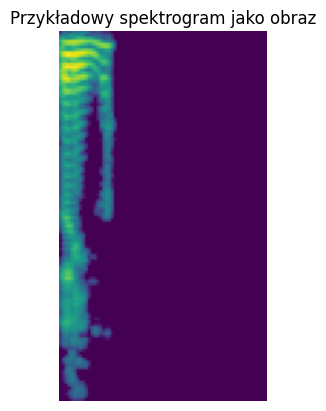

In [79]:
plt.imshow(X_train_with_augmented_spect[2])
plt.axis('off') 
plt.title("Przykładowy spektrogram jako obraz")
plt.show()

### Wizualizacji rozkładu word_indices dla każdej klasy

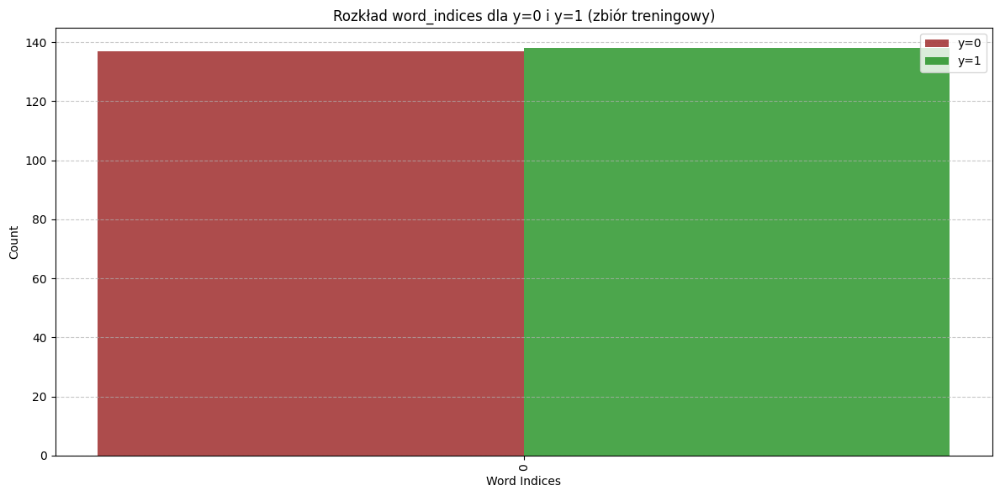

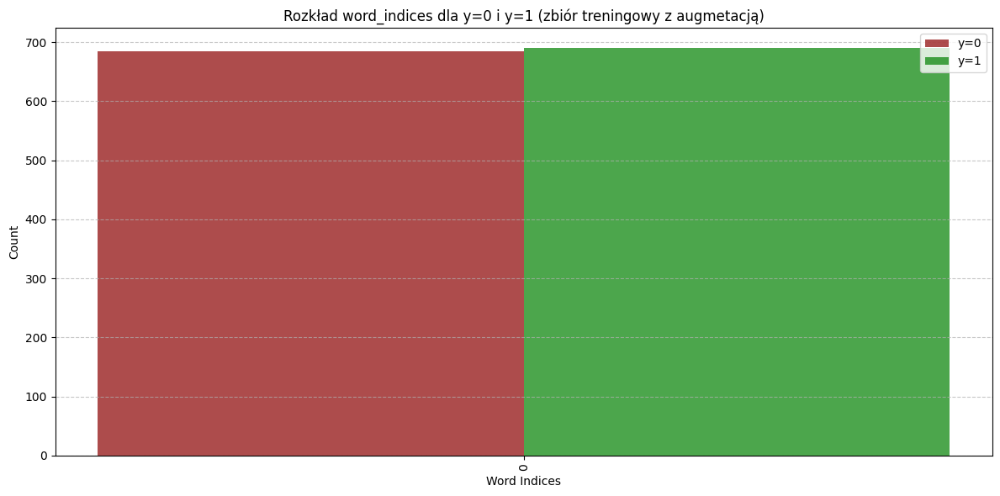

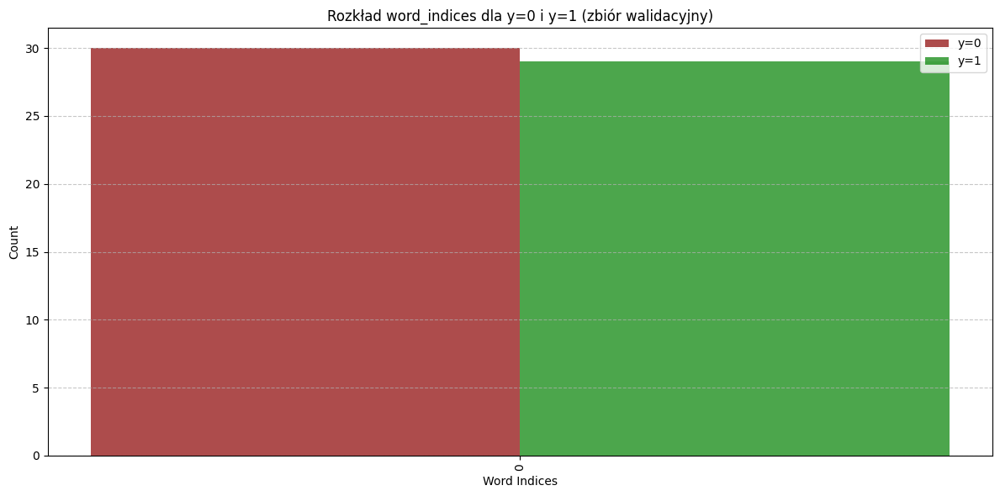

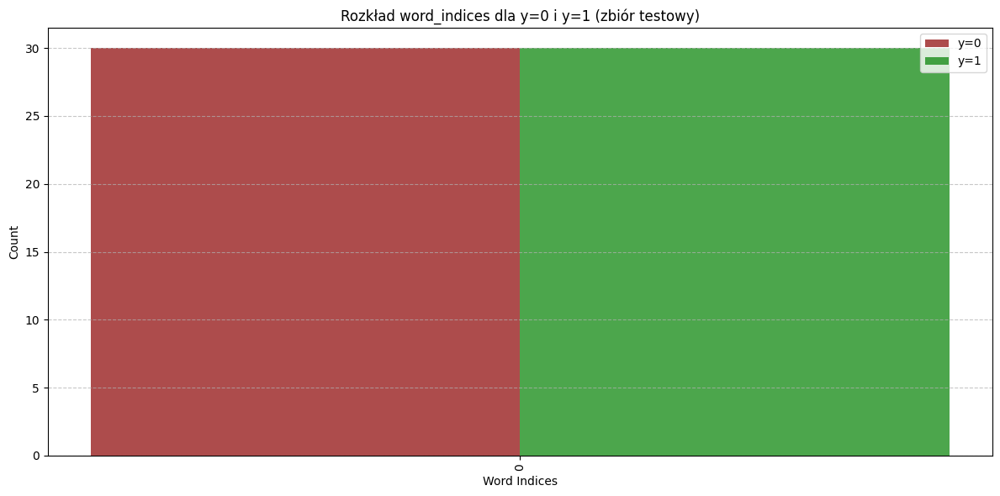

In [80]:
def plot_word_indices_grouped(word_indices, y, title):
    unique_word_indices = np.unique(word_indices)
    unique_labels = np.unique(y)
    word_label_counts = {word: {label: 0 for label in unique_labels} for word in unique_word_indices}
    for word, label in zip(word_indices, y):
        word_label_counts[word][label] += 1
    bar_width = 0.35
    index = np.arange(len(unique_word_indices))
    counts_class_0 = [word_label_counts[word][0] for word in unique_word_indices]
    counts_class_1 = [word_label_counts[word][1] for word in unique_word_indices]
    plt.figure(figsize=(12, 6))
    plt.bar(index - bar_width / 2, counts_class_0, bar_width, label='y=0', color='darkred', alpha=0.7)
    plt.bar(index + bar_width / 2, counts_class_1, bar_width, label='y=1', color='green', alpha=0.7)
    plt.xlabel('Word Indices')
    plt.ylabel('Count')
    plt.title(title)
    plt.xticks(index, unique_word_indices, rotation=90)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

plot_word_indices_grouped(word_indices_train, y_train, "Rozkład word_indices dla y=0 i y=1 (zbiór treningowy)")
plot_word_indices_grouped(word_indices_train_with_augmented, y_train_with_augmented, "Rozkład word_indices dla y=0 i y=1 (zbiór treningowy z augmetacją)")
plot_word_indices_grouped(word_indices_val, y_val, "Rozkład word_indices dla y=0 i y=1 (zbiór walidacyjny)")
plot_word_indices_grouped(word_indices_test, y_test, "Rozkład word_indices dla y=0 i y=1 (zbiór testowy)")


### Save data

In [81]:
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
subsets = ["train", "val", "test"]

In [82]:
save_dir = os.path.join(data_dir, timestamp, "mfcc")
for subset in subsets:
    os.makedirs(os.path.join(save_dir, subset), exist_ok=True)
save_data({"X_train": X_train, "y_train": y_train, "word_train": word_indices_train}, save_dir, "train")
save_data({"X_val": X_val, "y_val": y_val, "word_val": word_indices_val}, save_dir, "val")
save_data({"X_test": X_test, "y_test": y_test, "word_test": word_indices_test}, save_dir, "test")
print(f"zapisano w {save_dir}")

zapisano w data\20250121_111131\mfcc


In [83]:
save_dir = os.path.join(data_dir, timestamp, "mfcc_augmented")
for subset in subsets:
    os.makedirs(os.path.join(save_dir, subset), exist_ok=True)
save_data({"X_train": X_train_with_augmented, "y_train": y_train_with_augmented, "word_train": word_indices_train_with_augmented}, save_dir, "train")
save_data({"X_val": X_val, "y_val": y_val, "word_val": word_indices_val}, save_dir, "val")
save_data({"X_test": X_test, "y_test": y_test, "word_test": word_indices_test}, save_dir, "test")
print(f"zapisano w {save_dir}")

zapisano w data\20250121_111131\mfcc_augmented


In [84]:
save_dir = os.path.join(data_dir, timestamp, "spectrogram")
for subset in subsets:
    os.makedirs(os.path.join(save_dir, subset), exist_ok=True)
save_data({"X_train": X_train_spect, "y_train": y_train_spect, "word_train": word_indices_train_spect}, save_dir, "train")
save_data({"X_val": X_val_spect, "y_val": y_val_spect, "word_val": word_indices_val_spect}, save_dir, "val")
save_data({"X_test": X_test_spect, "y_test": y_test_spect, "word_test": word_indices_test_spect}, save_dir, "test")
print(f"zapisano w {save_dir}")

zapisano w data\20250121_111131\spectrogram


In [85]:
save_dir = os.path.join(data_dir, timestamp, "spectrogram_augmented")
for subset in subsets:
    os.makedirs(os.path.join(save_dir, subset), exist_ok=True)
save_data({"X_train": X_train_with_augmented_spect, "y_train": y_train_with_augmented_spect, "word_train": word_indices_train_with_augmented_spect}, save_dir, "train")
save_data({"X_val": X_val_spect, "y_val": y_val_spect, "word_val": word_indices_val_spect}, save_dir, "val")
save_data({"X_test": X_test_spect, "y_test": y_test_spect, "word_test": word_indices_test_spect}, save_dir, "test")
print(f"zapisano w {save_dir}")

zapisano w data\20250121_111131\spectrogram_augmented
